# Temperature Forecast Project 

# Importing Necessary Libraries

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import scipy as stats
import os
from sklearn.utils import shuffle
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

# Importing Dataset

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv")
pd.set_option("display.max_columns", None)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


The data set contain 7752 rows × 25 columns. In this dataset there are two columns:
    
1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature
    
Since, both the attributes are continues in nature so it is termed to be Regression Type Problem

# Exploratory Data Analysis(EDA)

In [3]:
df.shape

(7752, 25)

This data set contain 7752 rows × 25 columns.

In [4]:
#checking the value counts of each columns
for i in df.columns:
    print(df[i].value_counts())
    print('*'*50)

1.0     310
14.0    310
24.0    310
23.0    310
22.0    310
21.0    310
20.0    310
19.0    310
18.0    310
17.0    310
16.0    310
15.0    310
13.0    310
2.0     310
12.0    310
11.0    310
10.0    310
9.0     310
8.0     310
7.0     310
6.0     310
5.0     310
4.0     310
3.0     310
25.0    310
Name: station, dtype: int64
**************************************************
30-06-2013    25
18-07-2016    25
25-07-2016    25
24-07-2016    25
23-07-2016    25
              ..
09-08-2014    25
08-08-2014    25
07-08-2014    25
06-08-2014    25
30-08-2017    25
Name: Date, Length: 310, dtype: int64
**************************************************
31.4    112
29.4    111
29.1    108
29.7    107
31.9    105
       ... 
36.9      1
21.2      1
20.1      1
36.4      1
20.3      1
Name: Present_Tmax, Length: 167, dtype: int64
**************************************************
24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.6      1
14.2      1
29.1      1
29.7    

There are several missing values present in the dataset. We will use the appropriate imputation methods to fill the null values

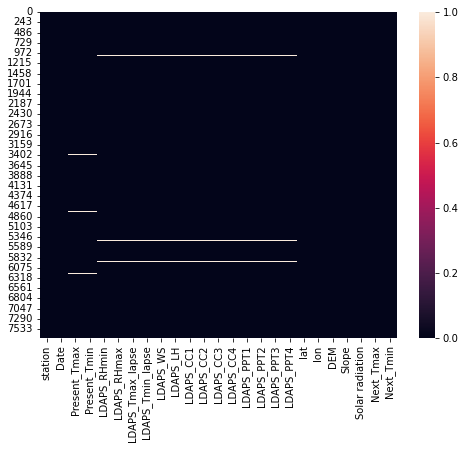

In [5]:
#lets visualize the null values
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.show()

# Teating Null Values

In [6]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [7]:
#checking the unique values in station column
df['station'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., nan])

In [8]:
#checking the unique values in Date column
df['Date'].unique()

array(['30-06-2013', '01-07-2013', '02-07-2013', '03-07-2013',
       '04-07-2013', '05-07-2013', '06-07-2013', '07-07-2013',
       '08-07-2013', '09-07-2013', '10-07-2013', '11-07-2013',
       '12-07-2013', '13-07-2013', '14-07-2013', '15-07-2013',
       '16-07-2013', '17-07-2013', '18-07-2013', '19-07-2013',
       '20-07-2013', '21-07-2013', '22-07-2013', '23-07-2013',
       '24-07-2013', '25-07-2013', '26-07-2013', '27-07-2013',
       '28-07-2013', '29-07-2013', '30-07-2013', '31-07-2013',
       '01-08-2013', '02-08-2013', '03-08-2013', '04-08-2013',
       '05-08-2013', '06-08-2013', '07-08-2013', '08-08-2013',
       '09-08-2013', '10-08-2013', '11-08-2013', '12-08-2013',
       '13-08-2013', '14-08-2013', '15-08-2013', '16-08-2013',
       '17-08-2013', '18-08-2013', '19-08-2013', '20-08-2013',
       '21-08-2013', '22-08-2013', '23-08-2013', '24-08-2013',
       '25-08-2013', '26-08-2013', '27-08-2013', '28-08-2013',
       '29-08-2013', '30-08-2013', '30-06-2014', '01-07

so it lookslike the data is collected for 25 stations and the last 2 entries are nan values. So I can replace them with station
1 and 2 considering the entried of nextday. The nan values in date column can be replaced by continueous of dates like 31-08-2017

In [9]:
#lets replace the null values in statio column

df['station'].iloc[7750]=1.0
df['station'].iloc[7751]=2.0

In [10]:
#lets replace the null values in statio column

df['Date'].iloc[7750]='31-08-2017'
df['Date'].iloc[7751]='31-08-2017'

In [11]:
#cheking the null
df.isnull().sum()

station              0
Date                 0
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [12]:
df.skew()

station             0.000182
Present_Tmax       -0.262942
Present_Tmin       -0.365875
LDAPS_RHmin         0.298765
LDAPS_RHmax        -0.850870
LDAPS_Tmax_lapse   -0.226775
LDAPS_Tmin_lapse   -0.578943
LDAPS_WS            1.571581
LDAPS_LH            0.670491
LDAPS_CC1           0.457231
LDAPS_CC2           0.470060
LDAPS_CC3           0.637630
LDAPS_CC4           0.663251
LDAPS_PPT1          5.367675
LDAPS_PPT2          5.747360
LDAPS_PPT3          6.425829
LDAPS_PPT4          6.792379
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.339607
Next_Tmin          -0.403743
dtype: float64

# Imputation method to replace nan Values

In [13]:
print("The mean of Present_Tmax is:", df["Present_Tmax"].mean())
print("The mean of Present_Tmin is:", df["Present_Tmin"].mean())
print("The mean of LDAPS_RHmin is:", df["LDAPS_RHmin"].mean())
print("The mean of LDAPS_Tmax_lapse is:", df["LDAPS_Tmax_lapse"].mean())
print("The mean of LDAPS_CC1 is:", df["LDAPS_CC1"].mean())
print("The mean of LDAPS_CC2 is:", df["LDAPS_CC2"].mean())
print("The mean of Next_Tmax is:", df["Next_Tmax"].mean())
print("The mean of Next_Tmin is:", df["Next_Tmin"].mean())


The mean of Present_Tmax is: 29.76821140328037
The mean of Present_Tmin is: 23.22505857849521
The mean of LDAPS_RHmin is: 56.75937215069287
The mean of LDAPS_Tmax_lapse is: 29.613446542813577
The mean of LDAPS_CC1 is: 0.36877358559828194
The mean of LDAPS_CC2 is: 0.35608043728396527
The mean of Next_Tmax is: 30.274886731391593
The mean of Next_Tmin is: 22.93222006472492


In [14]:
#Filling missing values in above columns using Mean method

cols=["Present_Tmax","Present_Tmin","LDAPS_RHmin","LDAPS_Tmax_lapse","LDAPS_CC1","LDAPS_CC2","Next_Tmax","Next_Tmin"]

for x in cols:
    df[x]=df[x].replace(np.nan, df[x].mean())

Here we have replaced all nan values in the above columns with their mean values

In [15]:
#checking median values of columns having outliers 
print("The median of LDAPS_RHmax is:", df["LDAPS_RHmax"].median())
print("The median of LDAPS_Tmin_lapse is:", df["LDAPS_Tmin_lapse"].median())
print("The median of LDAPS_WS is:", df["LDAPS_WS"].median())
print("The median of LDAPS_LH is:", df["LDAPS_LH"].median())
print("The median of LDAPS_CC3 is:", df["LDAPS_CC3"].median())
print("The median of LDAPS_CC4 is:", df["LDAPS_CC4"].median())
print("The median of LDAPS_PPT1 is:", df["LDAPS_PPT1"].median())
print("The median of LDAPS_PPT2 is:", df["LDAPS_PPT2"].median())
print("The median of LDAPS_PPT3 is:", df["LDAPS_PPT3"].median())
print("The median of LDAPS_PPT4 is:", df["LDAPS_PPT4"].median())

The median of LDAPS_RHmax is: 89.79347992
The median of LDAPS_Tmin_lapse is: 23.76019884
The median of LDAPS_WS is: 6.547470301
The median of LDAPS_LH is: 56.86548154
The median of LDAPS_CC3 is: 0.262554604
The median of LDAPS_CC4 is: 0.227664469
The median of LDAPS_PPT1 is: 0.0
The median of LDAPS_PPT2 is: 0.0
The median of LDAPS_PPT3 is: 0.0
The median of LDAPS_PPT4 is: 0.0


In [16]:
col=["LDAPS_RHmax","LDAPS_Tmin_lapse","LDAPS_WS","LDAPS_LH","LDAPS_CC3","LDAPS_CC4","LDAPS_PPT1","LDAPS_PPT2","LDAPS_PPT3","LDAPS_PPT4"]

for i in col:
    df[i]=df[i].replace(np.nan, df[i].median())

We have fill all the null values in the columns using mean and median values. Now lets check the null values again

In [17]:
#cheking null values again

df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

We can notice that there are no missing values present in the Dataset

By some observations we can noticethat the dataset is orderly arranged by date and station columns. So we can suffle the dataset to avoid the problem while building the models to get better results

In [18]:
#lets shuffle the dataset
df=shuffle(df)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
533,9.0,21-07-2013,29.200000,25.200000,81.782532,95.729111,27.814521,24.317790,10.547743,57.321984,0.821357,0.889711,0.583376,0.686718,14.518630,13.546898,0.000000,0.147758,37.4967,126.826,50.9312,0.4125,5640.645996,30.1,24.2
5999,25.0,22-08-2016,35.800000,27.200000,34.345760,66.239777,34.745632,25.737141,7.790389,13.164055,0.069977,0.005609,0.093490,0.406420,0.000000,0.000000,0.000000,0.000755,37.5237,126.970,19.5844,0.2713,4718.366699,33.3,26.9
299,25.0,11-07-2013,25.800000,24.600000,84.178810,94.419495,25.481014,23.001071,8.551321,45.080255,0.821964,0.868666,0.981652,0.882947,0.072129,2.965099,4.954381,0.946329,37.5237,126.970,19.5844,0.2713,5764.060547,25.0,23.6
6511,12.0,12-07-2017,31.200000,23.600000,43.563938,77.506500,31.219981,23.765736,6.252210,21.992350,0.000000,0.000000,0.000000,0.006636,0.000000,0.000000,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,5820.042480,32.0,22.7
6370,21.0,06-07-2017,33.200000,25.000000,74.630905,84.466125,28.486112,24.511316,6.529256,29.829378,0.255590,0.567537,0.831302,0.554953,0.000000,0.000000,0.295410,0.000000,37.5507,127.040,26.2980,0.5721,5818.526855,28.5,24.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1159,10.0,15-08-2013,30.900000,24.000000,54.888306,90.427208,31.223797,25.889138,7.788454,59.386241,0.362851,0.324792,0.072351,0.038142,0.000000,0.000000,0.000000,0.000000,37.4562,126.955,208.5070,5.1782,4950.244141,31.5,25.2
7329,5.0,14-08-2017,29.768211,23.225059,81.143448,94.774109,23.184602,20.866632,8.279906,53.180192,0.700207,0.818673,0.884128,0.915152,0.000000,3.661328,4.412761,5.466499,37.5507,127.135,35.0380,0.5055,5024.069336,24.4,20.6
4247,23.0,14-08-2015,32.700000,23.300000,53.976250,83.578499,30.637075,25.433863,5.836934,93.060532,0.156839,0.077295,0.131680,0.116528,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.1554,5019.769043,32.1,24.8
2340,16.0,31-07-2014,32.100000,24.000000,47.491364,92.656914,33.217549,24.425048,5.745048,89.150706,0.406790,0.238769,0.294447,0.235227,0.061403,0.000000,0.000000,0.000000,37.4697,126.995,82.2912,2.2579,5399.985840,33.2,22.5


In [19]:
#checking the type of dataset
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

# Feature Engineering

First we will convert the date from object type to datetime type and then we will extract day, month and year from the Date column

In [20]:
#convert the date from object type to datetime type
df["Date"]=pd.to_datetime(df["Date"])

In [21]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

We have converted Date column data type from object to datetime type

In [22]:
#Extracting Day drom Date column
df["Day"]=df["Date"].dt.day

#Extracting Month drom Date column
df["Month"]=df["Date"].dt.month

#Extracting Year drom Date column
df["Year"]=df["Date"].dt.year

We have extracted day month and year from date column,so we can drop date column as it is of no use

In [23]:
df.drop("Date",axis=1, inplace=True)

In [24]:
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
533,9.0,29.2,25.2,81.782532,95.729111,27.814521,24.317790,10.547743,57.321984,0.821357,0.889711,0.583376,0.686718,14.518630,13.546898,0.000000,0.147758,37.4967,126.826,50.9312,0.4125,5640.645996,30.1,24.2,21,7,2013
5999,25.0,35.8,27.2,34.345760,66.239777,34.745632,25.737141,7.790389,13.164055,0.069977,0.005609,0.093490,0.406420,0.000000,0.000000,0.000000,0.000755,37.5237,126.970,19.5844,0.2713,4718.366699,33.3,26.9,22,8,2016
299,25.0,25.8,24.6,84.178810,94.419495,25.481014,23.001071,8.551321,45.080255,0.821964,0.868666,0.981652,0.882947,0.072129,2.965099,4.954381,0.946329,37.5237,126.970,19.5844,0.2713,5764.060547,25.0,23.6,7,11,2013
6511,12.0,31.2,23.6,43.563938,77.506500,31.219981,23.765736,6.252210,21.992350,0.000000,0.000000,0.000000,0.006636,0.000000,0.000000,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,5820.042480,32.0,22.7,7,12,2017
6370,21.0,33.2,25.0,74.630905,84.466125,28.486112,24.511316,6.529256,29.829378,0.255590,0.567537,0.831302,0.554953,0.000000,0.000000,0.295410,0.000000,37.5507,127.040,26.2980,0.5721,5818.526855,28.5,24.8,7,6,2017


Hence, we have extracted  day month and year from date column and have drop date column 

In [25]:
#To get overview of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7752 entries, 533 to 7296
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Present_Tmax      7752 non-null   float64
 2   Present_Tmin      7752 non-null   float64
 3   LDAPS_RHmin       7752 non-null   float64
 4   LDAPS_RHmax       7752 non-null   float64
 5   LDAPS_Tmax_lapse  7752 non-null   float64
 6   LDAPS_Tmin_lapse  7752 non-null   float64
 7   LDAPS_WS          7752 non-null   float64
 8   LDAPS_LH          7752 non-null   float64
 9   LDAPS_CC1         7752 non-null   float64
 10  LDAPS_CC2         7752 non-null   float64
 11  LDAPS_CC3         7752 non-null   float64
 12  LDAPS_CC4         7752 non-null   float64
 13  LDAPS_PPT1        7752 non-null   float64
 14  LDAPS_PPT2        7752 non-null   float64
 15  LDAPS_PPT3        7752 non-null   float64
 16  LDAPS_PPT4        7752 non-null   float6

This gives the information about the dataset which includes indexing type, column type, no null values, memroy usage.


In [26]:
#Checking the number of unique values in each columns

df.nunique()

station               25
Present_Tmax         168
Present_Tmin         156
LDAPS_RHmin         7673
LDAPS_RHmax         7664
LDAPS_Tmax_lapse    7676
LDAPS_Tmin_lapse    7675
LDAPS_WS            7675
LDAPS_LH            7675
LDAPS_CC1           7570
LDAPS_CC2           7583
LDAPS_CC3           7599
LDAPS_CC4           7524
LDAPS_PPT1          2812
LDAPS_PPT2          2510
LDAPS_PPT3          2356
LDAPS_PPT4          1918
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            184
Next_Tmin            158
Day                   21
Month                 12
Year                   5
dtype: int64

These are number of unique values present in the dataset

In [27]:
#checking how many columns ar ethere in dataset
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year'],
      dtype='object')

These are the columns present in the dataset

In [28]:
#checking the list of counts in Next_Tmax
df["Next_Tmax"].value_counts()

29.3    113
33.0    106
31.3    104
29.6    101
31.2     98
       ... 
20.1      1
20.5      1
21.8      1
18.9      1
21.4      1
Name: Next_Tmax, Length: 184, dtype: int64

These are the counts of the target variable Next_Tmax

In [29]:
#checking the list of counts in Next_Tmin
df["Next_Tmin"].value_counts()

23.5    159
23.4    157
24.0    156
23.2    150
23.8    149
       ... 
15.2      1
13.3      1
29.0      1
13.6      1
12.9      1
Name: Next_Tmin, Length: 158, dtype: int64

These are the counts of the target variable Next_Tmin

# Description of Dataset

In [30]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.997033,29.768211,23.225059,56.759372,88.388529,29.613447,23.514984,7.092549,62.450457,0.368774,0.356080,0.317864,0.298499,0.586267,0.480310,0.275508,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220,16.374742,7.080882,2015.000516
std,7.213007,2.956557,2.403036,14.596973,7.158471,2.932898,2.334099,2.173913,33.571540,0.261185,0.256810,0.249208,0.253211,1.937198,1.754900,1.156495,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,2.483276,8.243617,2.238124,1.414487
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,7.000000,1.000000,2013.000000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,0.142328,0.103100,0.082741,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.313244,89.793480,29.662273,23.760199,6.547470,56.865482,0.320110,0.315667,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,0.554963,0.494007,0.497230,0.049122,0.016748,0.007231,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,31.000000,12.000000,2017.000000


The counts of columns are same which means there are no missing values present in the dataset

In most of the columns mean is greater than the median which means they are skewed towards right 

In some columns median is greater than the mean which means that they are skewed towards left

# Data Visualization

Univariate Analysis:

In [31]:
#checking categorical column
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print(categorical_col)

[]


There are no categorical column in dataset

In [32]:
#checking numerica column
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print(numerical_col)

['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year']


Above are the numeric columns present in the dataset

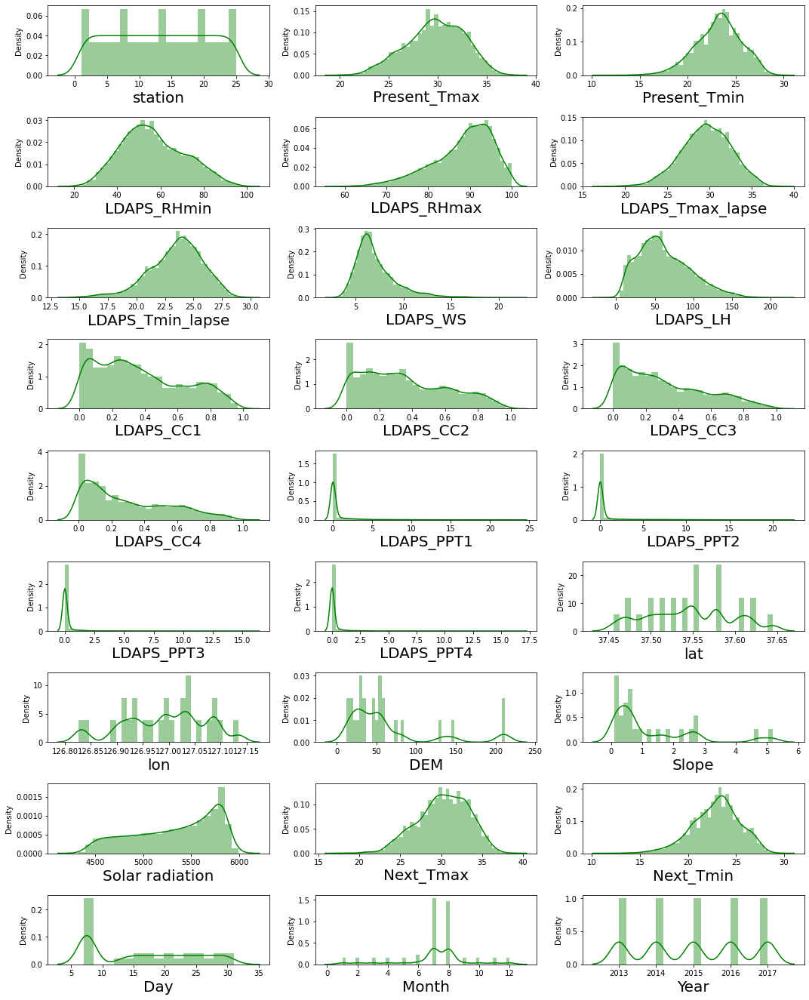

In [33]:
#Checking how data has beed distributed in each numeric column

plt.figure(figsize=(15,20), facecolor= 'white')
plotnumber=1

for column in numerical_col:
    if plotnumber <=30:
        ax= plt.subplot(10,3, plotnumber)
        sns.distplot(df[column], color='g')
        plt.xlabel(column, fontsize=20)
        
        
    plotnumber +=1
plt.tight_layout()

# Bivariate Analysis

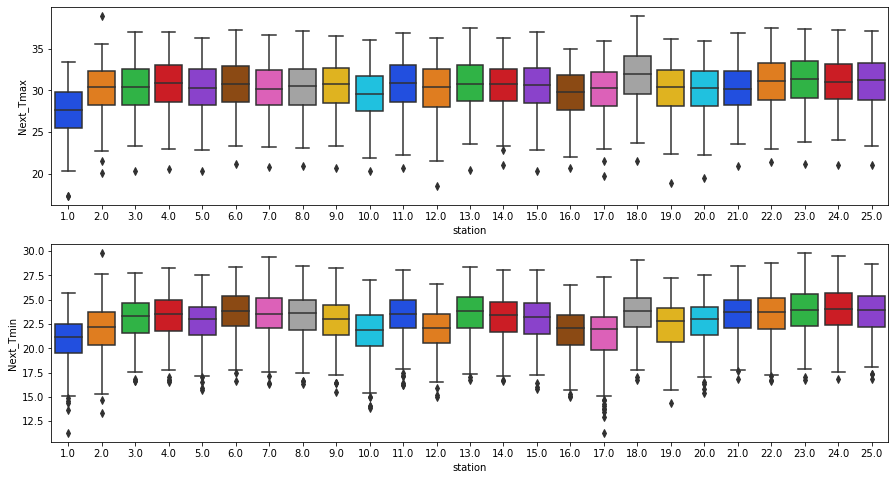

In [34]:
#Visualizing the relation between station and target variables
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(df['station'],df["Next_Tmax"],data=df,palette="bright")
plt.subplot(2,1,2)
sns.boxplot(df['station'],df["Next_Tmin"],data=df,palette="bright")
plt.show()


from the box plot we can notice that the station 18 has highest temperture collection for both target variables.

<AxesSubplot:title={'center':'Next Day Min Temperature Vs Present Day min Temperature'}, xlabel='Present_Tmin', ylabel='Next_Tmin'>

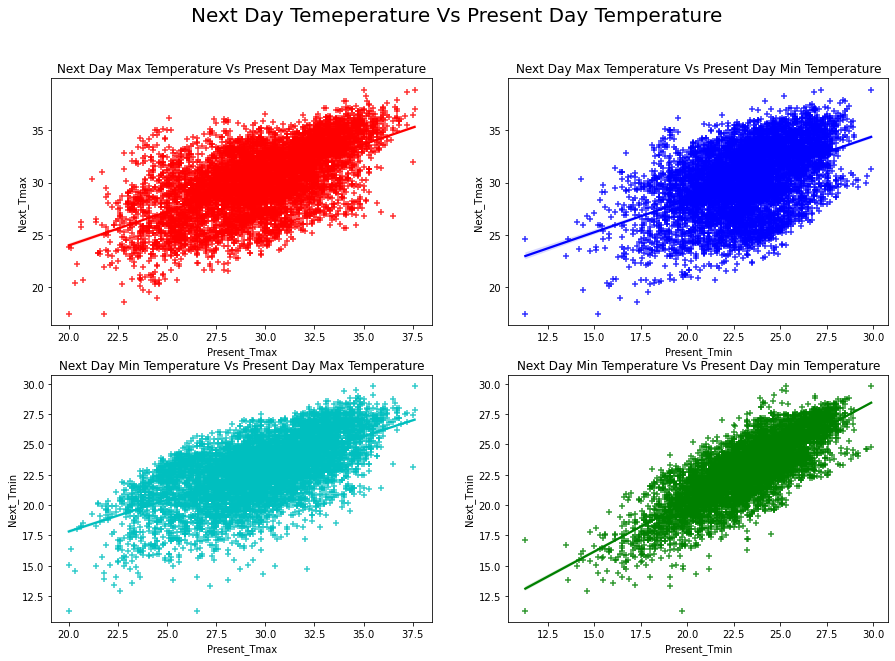

In [35]:
plt.figure(figsize=(15,10))
plt.suptitle("Next Day Temeperature Vs Present Day Temperature", fontsize=20)

plt.subplot(2,2,1)
plt.title("Next Day Max Temperature Vs Present Day Max Temperature")
sns.regplot(x='Present_Tmax', y="Next_Tmax", data=df, marker="+", color='r')

plt.subplot(2,2,2)
plt.title("Next Day Max Temperature Vs Present Day Min Temperature")
sns.regplot(x='Present_Tmin', y="Next_Tmax", data=df, marker="+", color='b')

plt.subplot(2,2,3)
plt.title("Next Day Min Temperature Vs Present Day Max Temperature")
sns.regplot(x='Present_Tmax', y="Next_Tmin", data=df, marker="+", color='c')

plt.subplot(2,2,4)
plt.title("Next Day Min Temperature Vs Present Day min Temperature")
sns.regplot(x='Present_Tmin', y="Next_Tmin", data=df, marker="+", color='g')

There is a strone Linear Relationship between next day temperature and present day temperature

As present day Tmax and Tmin increases, next data Tmin and Tmax increases

<AxesSubplot:title={'center':'Next Day Min Temperature Vs next Day min Relative Humidity'}, xlabel='LDAPS_RHmin', ylabel='Next_Tmin'>

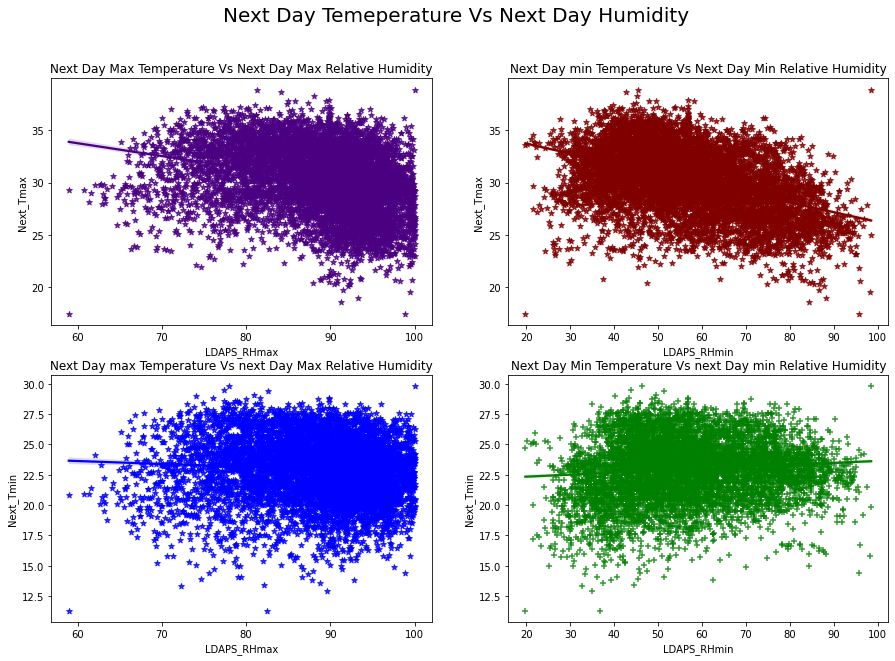

In [36]:
#compairing next day temperature and next day relative Humidity

plt.figure(figsize=(15,10))
plt.suptitle("Next Day Temeperature Vs Next Day Humidity", fontsize=20)

plt.subplot(2,2,1)
plt.title("Next Day Max Temperature Vs Next Day Max Relative Humidity")
sns.regplot(x='LDAPS_RHmax', y="Next_Tmax", data=df, marker="*", color='indigo')

plt.subplot(2,2,2)
plt.title("Next Day min Temperature Vs Next Day Min Relative Humidity")
sns.regplot(x='LDAPS_RHmin', y="Next_Tmax", data=df, marker="*", color='maroon')

plt.subplot(2,2,3)
plt.title("Next Day max Temperature Vs next Day Max Relative Humidity")
sns.regplot(x='LDAPS_RHmax', y="Next_Tmin", data=df, marker="*", color='blue')

plt.subplot(2,2,4)
plt.title("Next Day Min Temperature Vs next Day min Relative Humidity")
sns.regplot(x='LDAPS_RHmin', y="Next_Tmin", data=df, marker="+", color='green')

The columns LDAPS_RHmax and LDAPS_RHmin contain the forcast of next day minimum and minimum relative humidity in percentage(%) respectively

Next dat Tmax decrease with increase in LDAPS_RHmax and LDAPS_RHmin, but it is not true in case of Next_Tmin. Next_Tmin  seems to be uneffected by RHmax
we can also observe slight positive correlation between Next_Tmin and RHmin

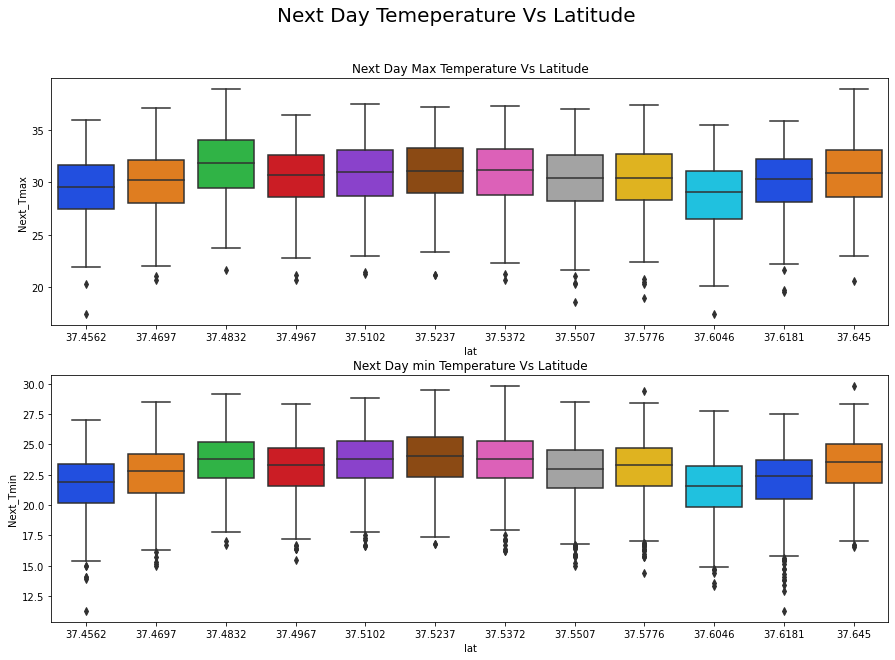

In [37]:
#compairing next day temperature and latitude

plt.figure(figsize=(15,10))
plt.suptitle("Next Day Temeperature Vs Latitude", fontsize=20)
plt.xticks(rotation=90)

plt.subplot(2,1,1)
plt.title("Next Day Max Temperature Vs Latitude")
sns.boxplot(x='lat', y="Next_Tmax", data=df, palette='bright')

plt.subplot(2,1,2)
plt.title("Next Day min Temperature Vs Latitude")
sns.boxplot(x='lat', y="Next_Tmin", data=df, palette='bright')
plt.show()

The highest Temperature observed at Latitude range 37.4832 for next_Tmax, but this not the case in next_Tmin, because other factors affect the Temperature

<AxesSubplot:title={'center':'Next Day min Temperature Vs Next Day 4th 6 hour average precipitation'}, xlabel='LDAPS_PPT3', ylabel='Next_Tmin'>

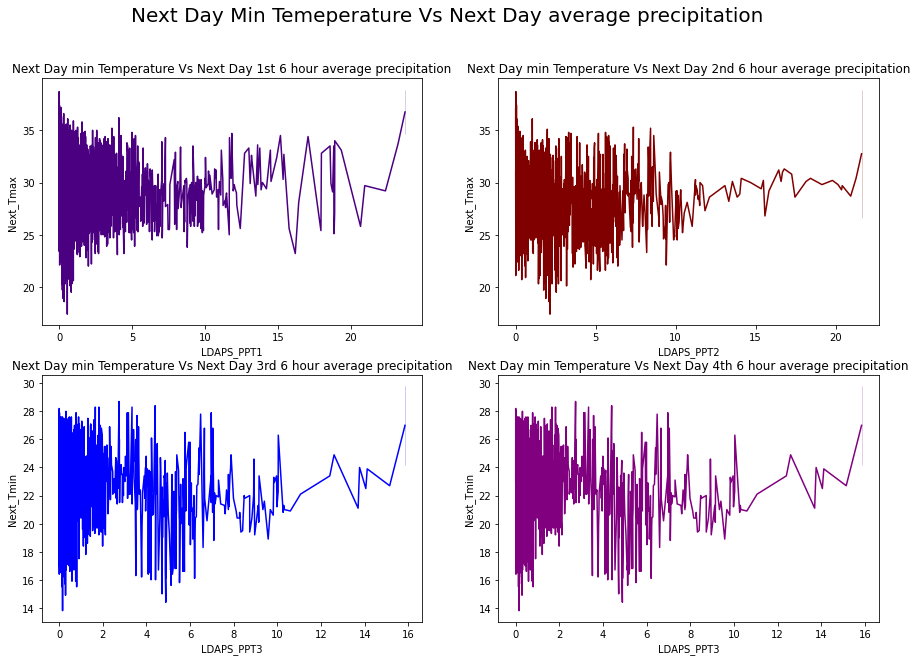

In [38]:
#compairing next day minimum temperature and next day average precipitation

plt.figure(figsize=(15,10))
plt.suptitle("Next Day Min Temeperature Vs Next Day average precipitation", fontsize=20)

plt.subplot(2,2,1)
plt.title("Next Day min Temperature Vs Next Day 1st 6 hour average precipitation")
sns.lineplot(x='LDAPS_PPT1', y="Next_Tmax", data=df, color='indigo')

plt.subplot(2,2,2)
plt.title("Next Day min Temperature Vs Next Day 2nd 6 hour average precipitation")
sns.lineplot(x='LDAPS_PPT2', y="Next_Tmax", data=df, color='maroon')
    
plt.subplot(2,2,3)
plt.title("Next Day min Temperature Vs Next Day 3rd 6 hour average precipitation")
sns.lineplot(x='LDAPS_PPT3', y="Next_Tmin", data=df, color='blue')

plt.subplot(2,2,4)
plt.title("Next Day min Temperature Vs Next Day 4th 6 hour average precipitation")
sns.lineplot(x='LDAPS_PPT3', y="Next_Tmin", data=df, color='purple')

There is no Linear relation between average precipitation and next day temperature

next_Tmin slightly increases as average precipitation increases

<AxesSubplot:title={'center':'Next Day min Temperature Vs Next Day average latent Heat flux'}, xlabel='LDAPS_LH', ylabel='Next_Tmin'>

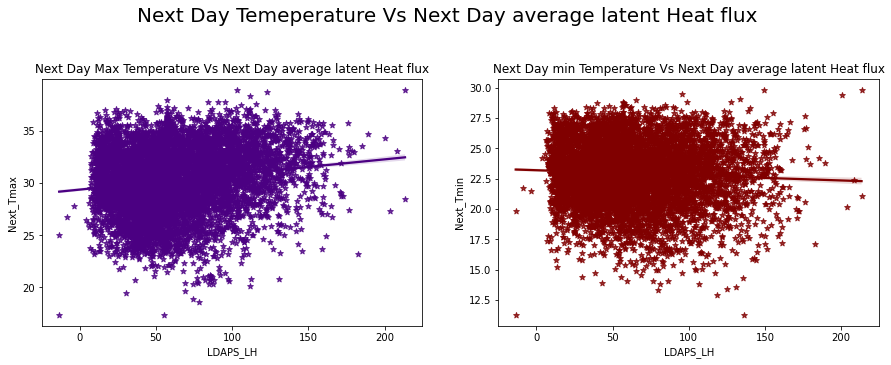

In [39]:
#compairing next day temperature and next day average latent Heat flux

plt.figure(figsize=(15,10))
plt.suptitle("Next Day Temeperature Vs Next Day average latent Heat flux", fontsize=20)

plt.subplot(2,2,1)
plt.title("Next Day Max Temperature Vs Next Day average latent Heat flux")
sns.regplot(x='LDAPS_LH', y="Next_Tmax", data=df, marker="*", color='indigo')

plt.subplot(2,2,2)
plt.title("Next Day min Temperature Vs Next Day average latent Heat flux")
sns.regplot(x='LDAPS_LH', y="Next_Tmin", data=df, marker="*", color='maroon')


LDAPS_LH gives forecast on next day average latent heat flux

There is no Linear relation between target and Features

As latent Heat flux increases, next day Tmax is also increases slightly while next dat Tmin  decreases

The latent Heat flux is almost distributed in the range of 10 to 160

<AxesSubplot:title={'center':'Next Day min Temperature Vs Next Day 4th 6 hour cloud  cover'}, xlabel='LDAPS_CC4', ylabel='Next_Tmin'>

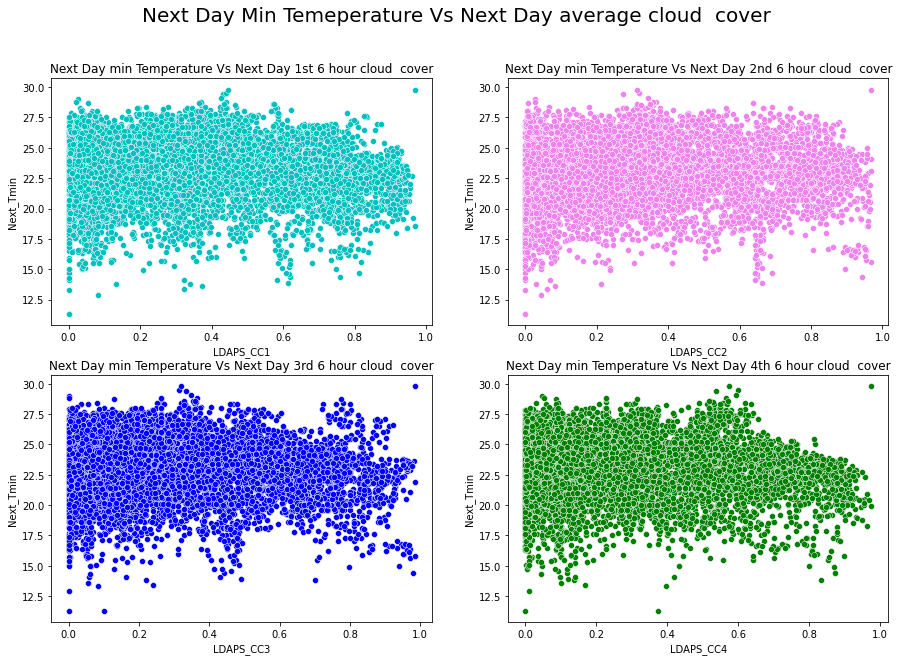

In [40]:
#compairing next day minimum temperature and next day average cloud  cover

plt.figure(figsize=(15,10))
plt.suptitle("Next Day Min Temeperature Vs Next Day average cloud  cover", fontsize=20)

plt.subplot(2,2,1)
plt.title("Next Day min Temperature Vs Next Day 1st 6 hour cloud  cover")
sns.scatterplot(x='LDAPS_CC1', y="Next_Tmin", data=df, color='c')

plt.subplot(2,2,2)
plt.title("Next Day min Temperature Vs Next Day 2nd 6 hour cloud  cover")
sns.scatterplot(x='LDAPS_CC2', y="Next_Tmin", data=df, color='violet')
    
plt.subplot(2,2,3)
plt.title("Next Day min Temperature Vs Next Day 3rd 6 hour cloud  cover")
sns.scatterplot(x='LDAPS_CC3', y="Next_Tmin", data=df, color='b')

plt.subplot(2,2,4)
plt.title("Next Day min Temperature Vs Next Day 4th 6 hour cloud  cover")
sns.scatterplot(x='LDAPS_CC4', y="Next_Tmin", data=df, color='g')

There is no significance relation between next day temperature and  cloud cover

we can say that next_tmin remains unaffected by cloud cover

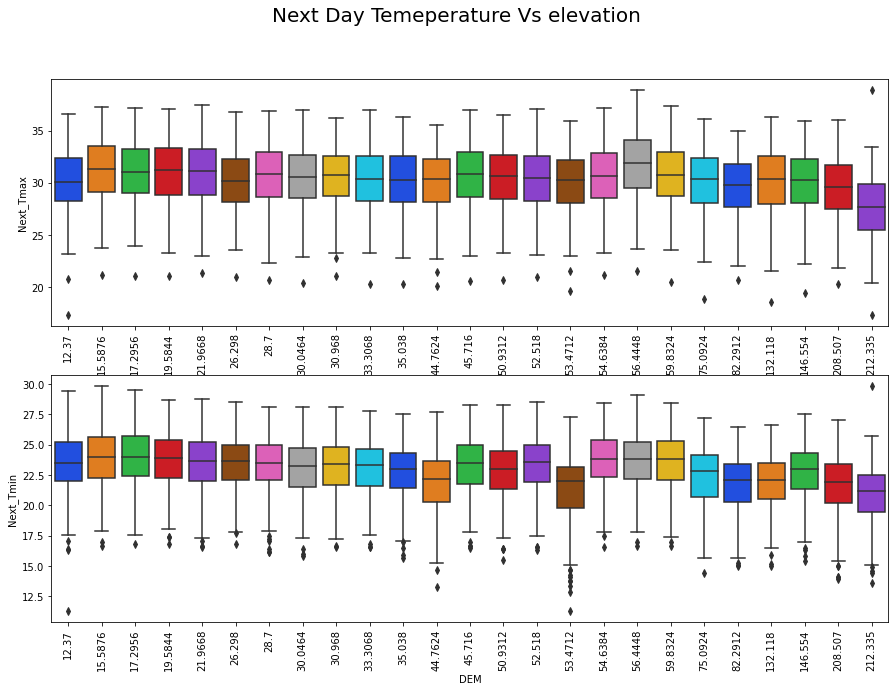

In [41]:
#compairing next day temperature and Elevation

plt.figure(figsize=(15,10))
plt.suptitle("Next Day Temeperature Vs elevation", fontsize=20)


plt.subplot(2,1,1)
sns.boxplot(x='DEM', y="Next_Tmax", data=df, palette='bright')
plt.xticks(rotation=90)

plt.subplot(2,1,2)
sns.boxplot(x='DEM', y="Next_Tmin", data=df, palette='bright')
plt.xticks(rotation=90)
plt.show()

The Highest temperature is observed at the elevation for 56.4448 Tmax and 15.5876 in Tmin

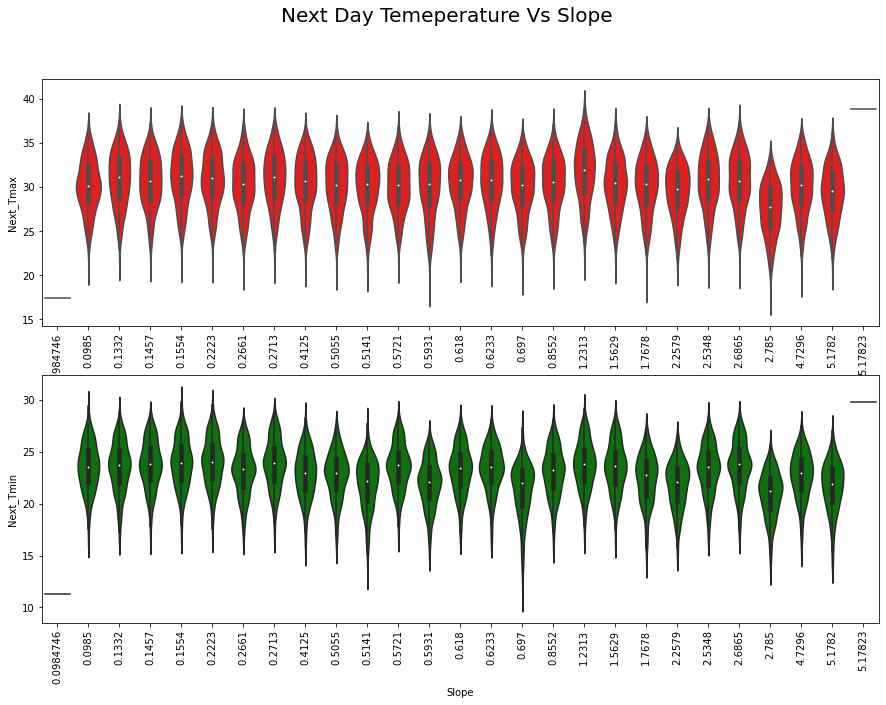

In [42]:
#compairing next day temperature and slope

plt.figure(figsize=(15,10))
plt.suptitle("Next Day Temeperature Vs Slope", fontsize=20)


plt.subplot(2,1,1)
sns.violinplot(x='Slope', y="Next_Tmax", data=df, color='red')
plt.xticks(rotation=90)

plt.subplot(2,1,2)
sns.violinplot(x='Slope', y="Next_Tmin", data=df, color='g')
plt.xticks(rotation=90)
plt.show()

Lowest and Highest temperature observed at consecutive slopes 2.785 and 1.2313 respectively in both the cases

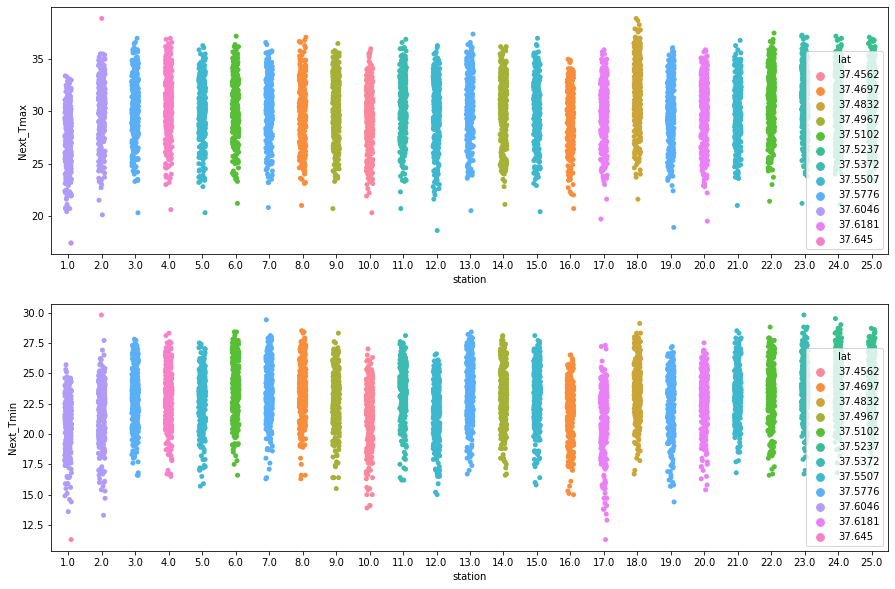

In [43]:
#Visualizing the relation between station and the target variable on the basis of latitude

plt.figure(figsize=(15,10))
plt.subplot(2,1,1)
sns.stripplot(df['station'],df['Next_Tmax'], data=df, hue=df["lat"])

plt.subplot(2,1,2)
sns.stripplot(df['station'],df['Next_Tmin'], data=df, hue=df["lat"])
plt.show()

As the latitude decreases in each station, the temperature seems to be increases

<AxesSubplot:title={'center':'comparision between Month and year'}, xlabel='Month', ylabel='Year'>

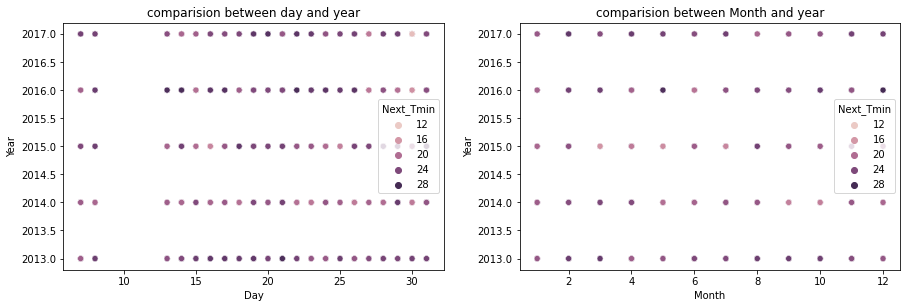

In [44]:
#compairing between features using scatterplot

plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.title("comparision between day and year")
sns.scatterplot(df['Day'], df['Year'], hue=df['Next_Tmin'])

plt.subplot(2,2,2)
plt.title("comparision between Month and year")
sns.scatterplot(df['Month'], df['Year'], hue=df['Next_Tmin'])

In the first graph we can notice that 6 to 13 day there is no temperature noted

I second graph it looks setteled

# Multivariate Analysis

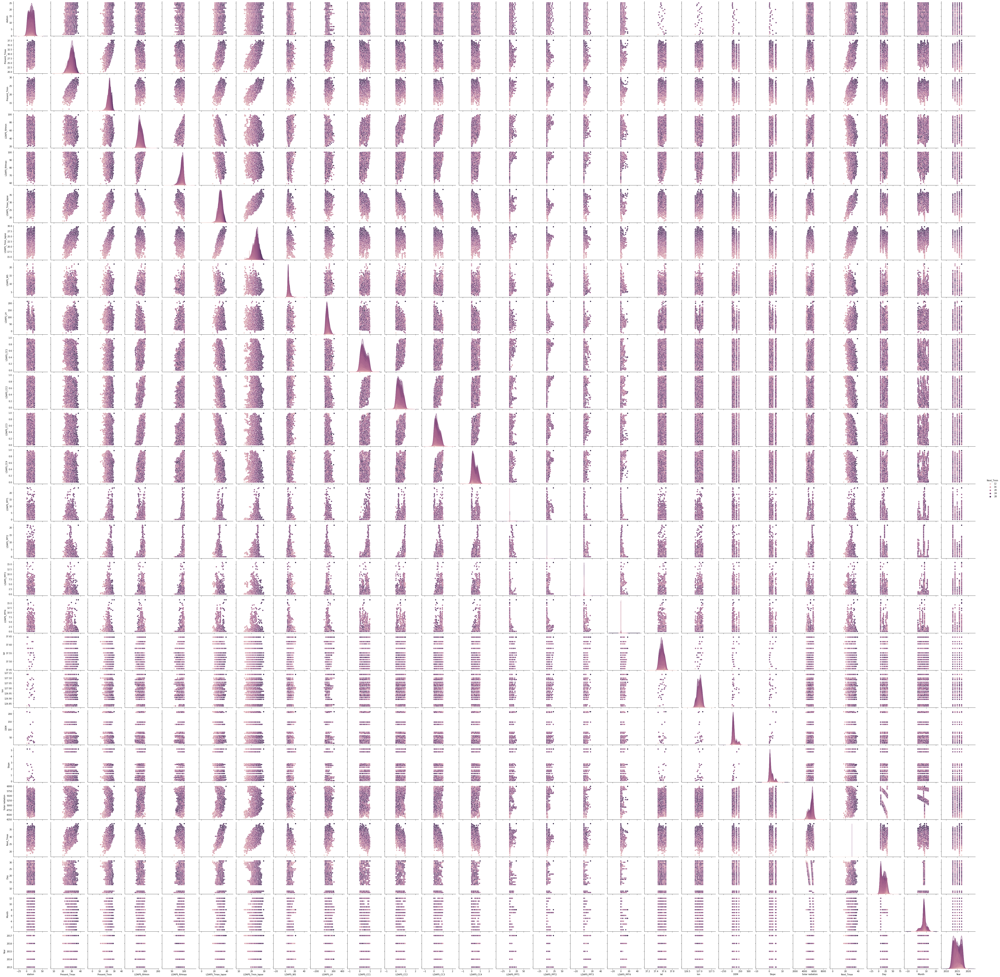

In [47]:
sns.pairplot(df, hue="Next_Tmin")

# Identifying the Outliers

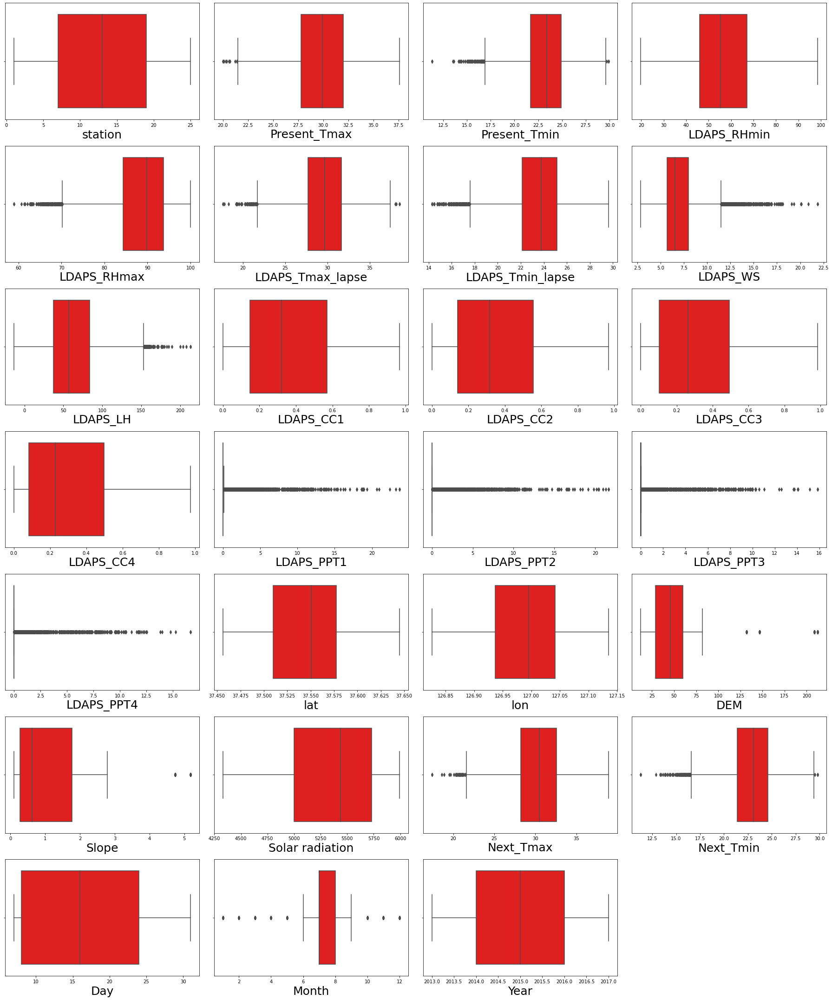

In [48]:
plt.figure(figsize=(25,30), facecolor= 'white')
plotnumber=1

for column in df.columns:
    if plotnumber <=27:
        ax= plt.subplot(7,4, plotnumber)
        sns.boxplot(df[column], color='r')
        plt.xlabel(column, fontsize=25)
        
        
    plotnumber +=1
plt.tight_layout()

# Removing Outliers

In [49]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year'],
      dtype='object')

In [50]:
features=df[['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH','LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','DEM', 'Slope','Month']]

from scipy.stats import zscore
z=np.abs(zscore(features))
df_new=df[(z<3).all(axis=1)]
df_new

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
6511,12.0,31.2,23.6,43.563938,77.506500,31.219981,23.765736,6.252210,21.992350,0.000000,0.000000,0.000000,0.006636,0.000000,0.000000,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,5820.042480,32.0,22.7,7,12,2017
6370,21.0,33.2,25.0,74.630905,84.466125,28.486112,24.511316,6.529256,29.829378,0.255590,0.567537,0.831302,0.554953,0.000000,0.000000,0.295410,0.000000,37.5507,127.040,26.2980,0.5721,5818.526855,28.5,24.8,7,6,2017
1678,4.0,29.7,23.2,42.798569,99.473572,30.106396,22.118980,6.971734,90.508474,0.553484,0.536656,0.126623,0.091410,0.002784,0.045591,0.000000,0.000000,37.6450,127.022,45.7160,2.5348,5824.259766,30.3,23.2,7,5,2014
5115,16.0,26.8,19.9,49.069923,94.746597,31.134897,21.156704,5.483732,101.307648,0.012303,0.021968,0.098066,0.115837,0.000000,0.000000,0.000000,0.000000,37.4697,126.995,82.2912,2.2579,5649.142578,31.1,19.7,18,7,2016
84,10.0,28.7,19.3,72.975418,92.025421,28.392311,22.160364,9.380760,41.223285,0.133501,0.377683,0.394177,0.775712,0.000000,0.000000,0.000000,0.054444,37.4562,126.955,208.5070,5.1782,5873.690430,26.2,22.6,7,3,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,20.0,29.7,24.0,62.643181,98.072517,30.009090,23.037067,7.678875,74.990457,0.118256,0.168742,0.146578,0.117902,0.001867,0.000000,0.140276,0.000000,37.6181,127.004,146.5540,4.7296,5735.703613,31.6,23.9,19,7,2014
1159,10.0,30.9,24.0,54.888306,90.427208,31.223797,25.889138,7.788454,59.386241,0.362851,0.324792,0.072351,0.038142,0.000000,0.000000,0.000000,0.000000,37.4562,126.955,208.5070,5.1782,4950.244141,31.5,25.2,15,8,2013
4247,23.0,32.7,23.3,53.976250,83.578499,30.637075,25.433863,5.836934,93.060532,0.156839,0.077295,0.131680,0.116528,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.1554,5019.769043,32.1,24.8,14,8,2015
2340,16.0,32.1,24.0,47.491364,92.656914,33.217549,24.425048,5.745048,89.150706,0.406790,0.238769,0.294447,0.235227,0.061403,0.000000,0.000000,0.000000,37.4697,126.995,82.2912,2.2579,5399.985840,33.2,22.5,31,7,2014


In [51]:
df.shape

(7752, 27)

In [52]:
df_new.shape

(6907, 27)

In [53]:
data_loss=(7752-6907)/7752*100
data_loss

10.900412796697626

Here we are losing morethan 10% data. Lets check the data loss using IQR method and then we will decide whether to remove outliers or not

# 2: IQR(Inter Quartile range) Method

In [54]:
#1st quartile
Q1=features.quantile(0.25)

#3rd quartile
Q3=features.quantile(0.75)

#IQR
IQR=Q3-Q1

df1=df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]

In [55]:
df1.shape

(2413, 27)

In [56]:
data_loss=(7752-2413)/7752*100
data_loss

68.87254901960785

Using 68.87 method we are losing 68.87data

By using both Zscore and IQR method we are losing more data. SO I'm not going to remove the outliers, it may have strong 
relation with columns. If we try to remove the outliers, it will impact the other variables since it eliminates one complete row
That row may have good test for other values. On this basis m not going to remove the outliers in any of the columns and keeping my dataframe as it is

# Correlation between the target variables  and independent variables using Heat Map

In [57]:
corr=df.corr()
corr

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
station,1.000000,0.112806,0.132122,-0.066731,-0.166334,0.069363,0.105053,0.004353,-0.133693,0.006769,0.003223,0.000442,0.005849,-0.004990,-0.010555,-0.015051,-0.013033,-0.237438,-0.118574,-0.256095,-0.090413,-0.018787,0.108289,0.128713,-0.000730,-0.000169,-0.000582
Present_Tmax,0.112806,1.000000,0.618760,-0.204571,-0.300322,0.570129,0.624216,-0.123582,0.134251,-0.311805,-0.213791,-0.145577,-0.142683,-0.111129,-0.101377,-0.122044,-0.101178,-0.052615,0.009020,-0.187121,-0.105809,-0.025439,0.610348,0.622741,-0.143899,-0.001185,0.059665
Present_Tmin,0.132122,0.618760,1.000000,0.123143,-0.012754,0.464151,0.764227,-0.037708,-0.011276,0.084447,0.090263,-0.005466,-0.047714,0.109121,0.064829,-0.049005,-0.065647,-0.078475,-0.043461,-0.250275,-0.146339,0.053578,0.471806,0.796670,-0.108728,-0.003550,0.036987
LDAPS_RHmin,-0.066731,-0.204571,0.123143,1.000000,0.579032,-0.564580,0.089471,0.294271,-0.070848,0.613818,0.745443,0.689513,0.513878,0.262547,0.390824,0.240576,0.168555,0.087099,-0.076237,0.102115,0.123744,0.244080,-0.437898,0.095019,-0.065735,-0.053922,-0.001984
LDAPS_RHmax,-0.166334,-0.300322,-0.012754,0.579032,1.000000,-0.373334,-0.113914,0.134786,0.238183,0.436570,0.391256,0.226434,0.130008,0.267698,0.228398,0.134087,0.117376,0.195761,0.025662,0.177134,0.219557,0.148259,-0.281341,-0.070246,-0.012803,-0.039040,-0.142223
LDAPS_Tmax_lapse,0.069363,0.570129,0.464151,-0.564580,-0.373334,1.000000,0.653985,-0.311900,0.048004,-0.438439,-0.523619,-0.541197,-0.429374,-0.111016,-0.242033,-0.188063,-0.160235,-0.042093,0.090666,-0.178895,-0.162332,0.047971,0.827189,0.586868,-0.160495,-0.021745,0.015978
LDAPS_Tmin_lapse,0.105053,0.624216,0.764227,0.089471,-0.113914,0.653985,1.000000,-0.130245,-0.134906,0.010900,0.047725,-0.044233,-0.080587,0.037727,0.000588,-0.088791,-0.094855,-0.096252,-0.026700,-0.195445,-0.185839,0.159445,0.588206,0.881059,-0.177770,-0.026990,-0.004937
LDAPS_WS,0.004353,-0.123582,-0.037708,0.294271,0.134786,-0.311900,-0.130245,1.000000,0.007115,0.289356,0.261010,0.243402,0.221066,0.153213,0.192427,0.162173,0.144550,0.036646,-0.059448,0.190995,0.171577,0.122966,-0.345619,-0.098767,-0.028982,-0.082375,-0.110409
LDAPS_LH,-0.133693,0.134251,-0.011276,-0.070848,0.238183,0.048004,-0.134906,0.007115,1.000000,-0.147276,-0.264245,-0.245130,-0.172222,-0.012042,-0.077061,0.016483,0.020332,0.133203,0.025819,0.055126,0.086770,-0.046553,0.155608,-0.056906,-0.012227,-0.023536,0.057462
LDAPS_CC1,0.006769,-0.311805,0.084447,0.613818,0.436570,-0.438439,0.010900,0.289356,-0.147276,1.000000,0.779683,0.517368,0.360908,0.446128,0.389310,0.168695,0.091700,-0.008131,-0.006843,-0.014090,-0.020752,0.218309,-0.452541,-0.011028,-0.019928,-0.076224,-0.066300


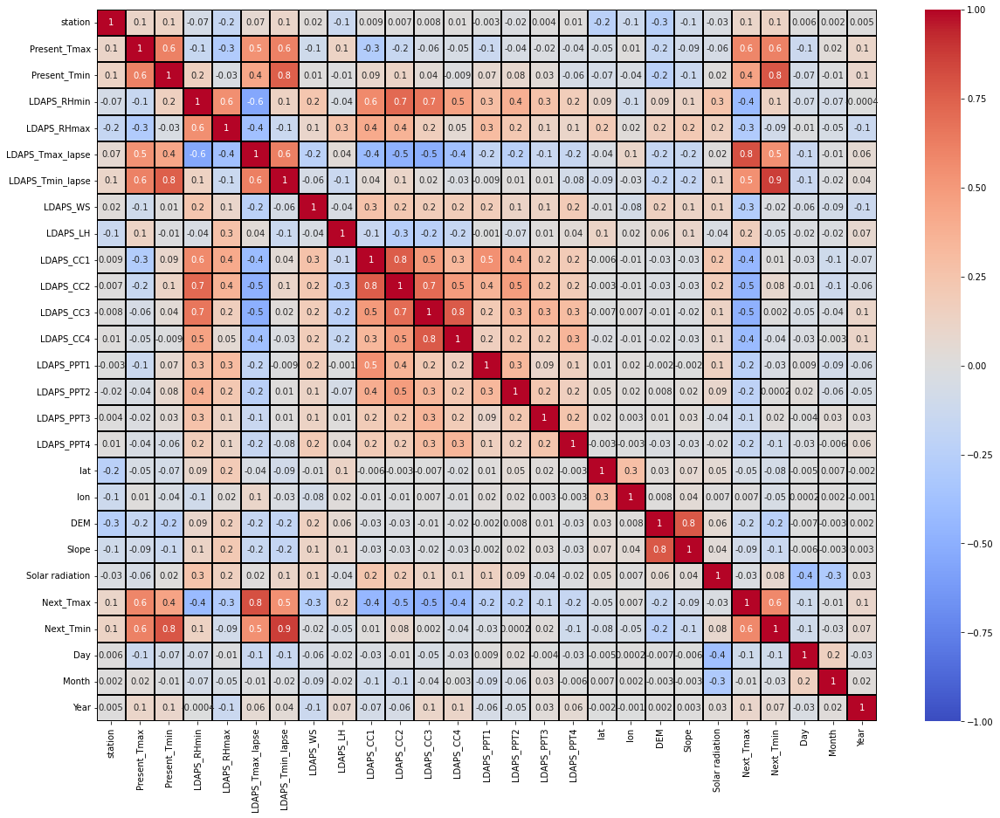

In [58]:
#Visualizing the correlation using heat map

plt.figure(figsize=(20,15))
sns.heatmap(df_new.corr(), linewidths=.1,vmin=-1,vmax=1,fmt='.1g',annot=True,linecolor="black", annot_kws={'size':10}, cmap="coolwarm")
plt.yticks(rotation=0);

From the heatmap we can observe that most of the features are highly correlated with each other which leads to a multicolinearity problem. We will check VIF values and then drop the columns containing VIF less than 5 to get rid of Multicolinearity issue

# 1. Prediction for Next_Tmax

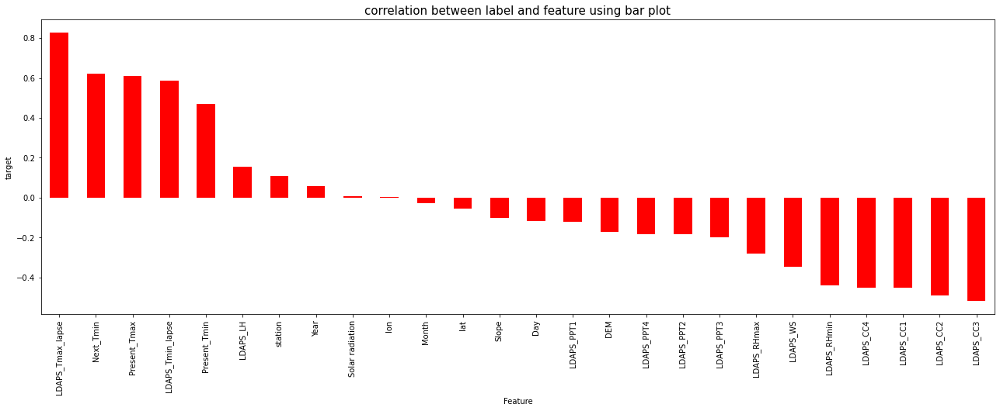

In [59]:
# Visualizing the correlation between label and features using bar plot

plt.figure(figsize=(22,7))
df.corr()['Next_Tmax'].sort_values(ascending=False).drop('Next_Tmax').plot(kind='bar', color='r')
plt.xlabel('Feature', fontsize=10)
plt.ylabel('target', fontsize=10)
plt.title('correlation between label and feature using bar plot', fontsize=15)
plt.show()

The columns Solar radiation and longitude have very less correlation with the label. We can drop the column if necessary

# Seperating the features  and label variables into x and y

In [60]:
x=df.drop("Next_Tmax", axis=1)
y=df["Next_Tmax"]

In [61]:
x.shape

(7752, 26)

In [62]:
y.shape

(7752,)

# Checking the Skewness

In [63]:
x.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.646670
LDAPS_CC4           0.673700
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmin          -0.404447
Day                 0.245283
Month              -0.705586
Year               -0.000365
dtype: float64

# Removing skewness using Yeo-Johson Method

In [64]:
skew=['LDAPS_RHmax','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1',
      'LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Solar radiation','Month']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [65]:
x[skew]=scaler.fit_transform(x[skew].values)
x[skew].head()

,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Month
533,1.153527,0.274966,1.505522,-0.042661,1.106605,1.393562,2.198739,2.380702,-0.492283,1.626425,0.230743,-0.591988,0.659269,-0.126054
5999,-2.186681,0.981977,0.575060,-1.738532,-0.941867,0.646643,-0.557339,-0.519114,-0.492283,-0.425926,-1.193124,-0.935044,-1.377060,0.363879
299,0.883938,-0.316505,0.883424,-0.432716,1.954949,1.752736,0.091029,2.376014,2.562260,2.681417,-1.193124,-0.935044,1.045619,2.018807
6511,-1.452975,0.019614,-0.237289,-1.310132,-1.597167,-1.428796,-0.557339,-0.519114,-0.492283,-0.444377,1.364199,-0.243155,1.231465,2.628001
6370,-0.715416,0.367047,-0.067423,-0.983725,1.683573,1.085365,-0.557339,-0.519114,2.059972,-0.444377,-0.721547,-0.279532,1.226344,-0.582534


In [66]:
#checking again after removing skewness

x.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.116481
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.018120
LDAPS_WS            0.002449
LDAPS_LH            0.058865
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.089672
LDAPS_CC4           0.129826
LDAPS_PPT1          1.463941
LDAPS_PPT2          1.646417
LDAPS_PPT3          1.824919
LDAPS_PPT4          2.059400
lat                 0.087062
lon                -0.285213
DEM                 0.039456
Slope               0.233968
Solar radiation    -0.176636
Next_Tmin          -0.404447
Day                 0.245283
Month               0.043780
Year               -0.000365
dtype: float64

In some columns skewness is not removed because these columns may have some extreme test level. So keeping the skewness in those columns as it is and moving further

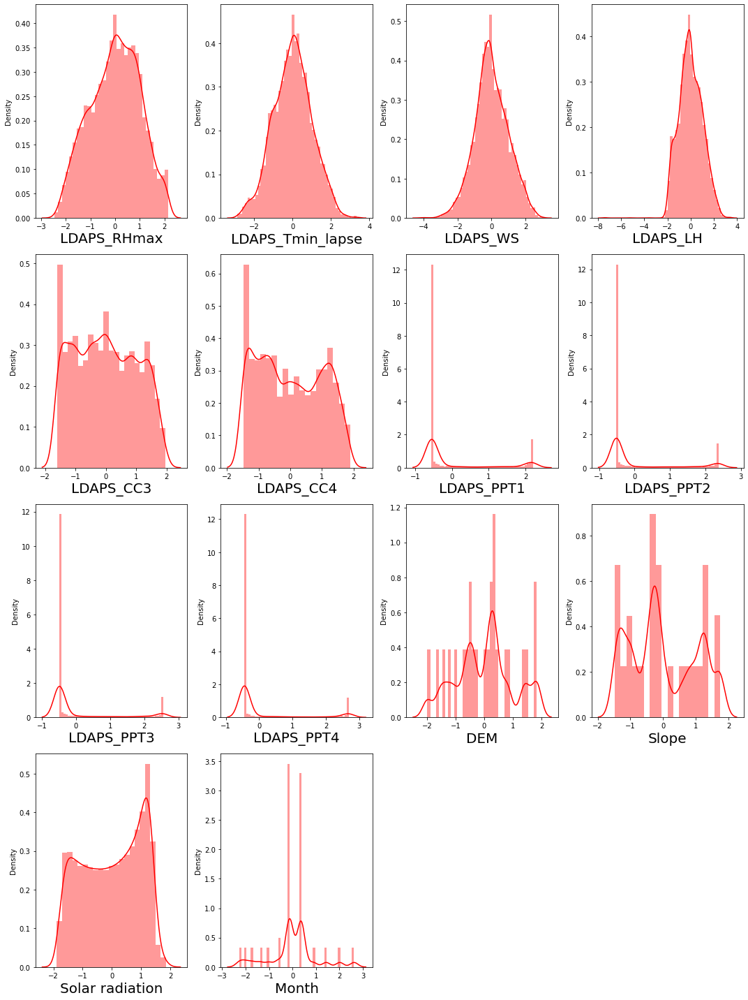

In [67]:
#after removing the skewness lets check how the data has been distributed  in each column


plt.figure(figsize=(15,20), facecolor= 'white')
plotnumber=1

for column in x[skew]:
    if plotnumber <=14:
        ax= plt.subplot(4,4, plotnumber)
        sns.distplot(x[column], color='red')
        plt.xlabel(column, fontsize=20)
        
        
    plotnumber +=1
plt.tight_layout()

since the precipitation  columns have  skewness and not in normal so we will use MinMaxScaler to scale the date

In [68]:
from sklearn.preprocessing import MinMaxScaler

mms=MinMaxScaler()
x=pd.DataFrame(mms.fit_transform(x), columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Day,Month,Year
0,0.333333,0.522727,0.747312,0.787347,0.784136,0.487136,0.510055,0.787998,0.679516,0.849143,0.918787,0.760418,0.852802,0.999978,0.999997,0.000000,0.658820,0.214513,0.000000,0.580057,0.274979,0.681477,0.697297,0.583333,0.437757,0.00
1,1.000000,0.897727,0.854839,0.184823,0.057896,0.818494,0.624076,0.658037,0.523963,0.072345,0.005792,0.184299,0.631273,0.000000,0.000000,0.000000,0.005870,0.357521,0.466019,0.207329,0.168421,0.136494,0.843243,0.625000,0.537778,0.75
2,1.000000,0.329545,0.715054,0.817783,0.725521,0.375577,0.414667,0.701108,0.643738,0.849770,0.897055,0.999009,0.959329,0.235245,0.998380,0.999996,0.994464,0.357521,0.466019,0.207329,0.168421,0.784876,0.664865,0.000000,0.875633,0.00
3,0.458333,0.636364,0.661290,0.301908,0.217421,0.649942,0.468873,0.544574,0.563258,0.000000,0.000000,0.000000,0.015718,0.000000,0.000000,0.000000,0.000000,0.500530,0.524272,0.876763,0.383332,0.834614,0.616216,0.000000,1.000000,1.00
4,0.833333,0.750000,0.736559,0.696509,0.377784,0.519243,0.524905,0.568300,0.593197,0.264237,0.586084,0.922687,0.761394,0.000000,0.000000,0.835557,0.000000,0.500530,0.692557,0.330774,0.372033,0.833243,0.729730,0.000000,0.344567,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,0.375000,0.619318,0.682796,0.445746,0.566555,0.650124,0.636999,0.657919,0.685237,0.375126,0.335406,0.145800,0.086854,0.000000,0.000000,0.000000,0.000000,0.000000,0.417476,0.995545,0.999999,0.240798,0.751351,0.333333,0.537778,0.00
7748,0.166667,0.555012,0.641132,0.779229,0.741062,0.265792,0.280034,0.686525,0.667784,0.723895,0.845429,0.951074,0.974173,0.000000,0.999239,0.999992,1.000000,0.500530,1.000000,0.443625,0.334076,0.278108,0.502703,0.291667,0.537778,1.00
7749,0.916667,0.721591,0.645161,0.434162,0.354041,0.622075,0.598708,0.505552,0.769553,0.162144,0.079821,0.249744,0.241848,0.000000,0.000000,0.000000,0.000000,0.429025,0.210356,0.106545,0.061134,0.275878,0.729730,0.291667,0.537778,0.50
7750,0.625000,0.687500,0.682796,0.351793,0.651804,0.745440,0.518258,0.496293,0.760476,0.420552,0.246573,0.480317,0.429701,0.205056,0.000000,0.000000,0.000000,0.071504,0.546926,0.738127,0.810963,0.502956,0.605405,1.000000,0.437757,0.25


# Checking VIF Values(Variance Inflation Factor)

In [69]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.535428,station
1,34.326786,Present_Tmax
2,87.573461,Present_Tmin
3,46.304936,LDAPS_RHmin
4,18.931767,LDAPS_RHmax
5,91.235502,LDAPS_Tmax_lapse
6,65.391863,LDAPS_Tmin_lapse
7,20.706293,LDAPS_WS
8,64.171809,LDAPS_LH
9,15.196003,LDAPS_CC1


The column Next_Tmin has VIF greater than 10, we will remove this to overcome with the issue of multicolinearity. After dropping
the column will check VIF again. If we find the value above 10 then we will remove that column having VIF. This process will continue
until will get the VIF less than 10

In [70]:
#dropping Next_Tmin column
x.drop("Next_Tmin", axis=1, inplace=True)

In [71]:
#checking the VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.534770,station
1,33.775211,Present_Tmax
2,77.650831,Present_Tmin
3,44.961529,LDAPS_RHmin
4,18.750713,LDAPS_RHmax
5,85.634325,LDAPS_Tmax_lapse
6,53.842800,LDAPS_Tmin_lapse
7,20.441734,LDAPS_WS
8,64.094992,LDAPS_LH
9,15.191476,LDAPS_CC1


LDAPS_Tmin_lapse has high VIF values compare to other columns. lets drop it

In [72]:
x.drop("LDAPS_Tmax_lapse", axis=1, inplace=True)

In [73]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.448455,station
1,33.514842,Present_Tmax
2,74.270762,Present_Tmin
3,32.144165,LDAPS_RHmin
4,18.587646,LDAPS_RHmax
5,29.540906,LDAPS_Tmin_lapse
6,20.406185,LDAPS_WS
7,50.196246,LDAPS_LH
8,15.077095,LDAPS_CC1
9,17.526319,LDAPS_CC2


After removing two columns alse we are getting VIF High value in Present_Tmin. We will drop this

In [74]:
#dropping Present_Tmin column
x.drop("Present_Tmin", axis=1, inplace=True)

In [75]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.422332,station
1,29.139375,Present_Tmax
2,32.124333,LDAPS_RHmin
3,18.146943,LDAPS_RHmax
4,20.074250,LDAPS_Tmin_lapse
5,19.820954,LDAPS_WS
6,48.036006,LDAPS_LH
7,14.853205,LDAPS_CC1
8,17.525836,LDAPS_CC2
9,17.701459,LDAPS_CC3


In [76]:
#droping LDAPS_LH column
x.drop("LDAPS_LH", axis=1, inplace=True)

In [77]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.357750,station
1,22.420439,Present_Tmax
2,31.898138,LDAPS_RHmin
3,15.012201,LDAPS_RHmax
4,19.565808,LDAPS_Tmin_lapse
5,17.942441,LDAPS_WS
6,14.506970,LDAPS_CC1
7,16.963098,LDAPS_CC2
8,17.584827,LDAPS_CC3
9,9.659758,LDAPS_CC4


In [78]:
x.drop("LDAPS_RHmin", axis=1, inplace=True)

In [79]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.353489,station
1,21.959437,Present_Tmax
2,10.499715,LDAPS_RHmax
3,17.943622,LDAPS_Tmin_lapse
4,17.494162,LDAPS_WS
5,14.424490,LDAPS_CC1
6,15.972219,LDAPS_CC2
7,15.747872,LDAPS_CC3
8,9.644795,LDAPS_CC4
9,3.300489,LDAPS_PPT1


In [80]:
x.drop("Present_Tmax", axis=1, inplace=True)

In [81]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.249027,station
1,10.494177,LDAPS_RHmax
2,8.455903,LDAPS_Tmin_lapse
3,16.864879,LDAPS_WS
4,13.559921,LDAPS_CC1
5,15.963881,LDAPS_CC2
6,15.656609,LDAPS_CC3
7,9.638630,LDAPS_CC4
8,3.270818,LDAPS_PPT1
9,2.956593,LDAPS_PPT2


In [82]:
x.drop("LDAPS_WS", axis=1, inplace=True)

In [83]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.968764,station
1,10.436610,LDAPS_RHmax
2,7.862778,LDAPS_Tmin_lapse
3,13.491842,LDAPS_CC1
4,15.963879,LDAPS_CC2
5,15.636448,LDAPS_CC3
6,9.616443,LDAPS_CC4
7,3.269027,LDAPS_PPT1
8,2.955624,LDAPS_PPT2
9,2.200587,LDAPS_PPT3


In [84]:
x.drop("LDAPS_CC2", axis=1, inplace=True)

In [85]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.968088,station
1,10.275045,LDAPS_RHmax
2,7.779405,LDAPS_Tmin_lapse
3,9.312590,LDAPS_CC1
4,12.846864,LDAPS_CC3
5,9.616340,LDAPS_CC4
6,3.072742,LDAPS_PPT1
7,2.322113,LDAPS_PPT2
8,2.199760,LDAPS_PPT3
9,2.027317,LDAPS_PPT4


In [86]:
x.drop("DEM", axis=1, inplace=True)

In [87]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.680109,station
1,10.128386,LDAPS_RHmax
2,7.716922,LDAPS_Tmin_lapse
3,9.311825,LDAPS_CC1
4,12.843669,LDAPS_CC3
5,9.614301,LDAPS_CC4
6,3.068458,LDAPS_PPT1
7,2.318813,LDAPS_PPT2
8,2.199743,LDAPS_PPT3
9,2.027274,LDAPS_PPT4


In [88]:
x.drop("LDAPS_CC3", axis=1, inplace=True)

In [89]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.680031,station
1,10.128315,LDAPS_RHmax
2,7.687641,LDAPS_Tmin_lapse
3,8.363750,LDAPS_CC1
4,5.068478,LDAPS_CC4
5,2.973010,LDAPS_PPT1
6,2.303686,LDAPS_PPT2
7,1.977942,LDAPS_PPT3
8,2.015596,LDAPS_PPT4
9,4.878332,lat


In [90]:
x.drop("LDAPS_RHmax", axis=1, inplace=True)

In [91]:
#checking VIF again

vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.680020,station
1,7.637569,LDAPS_Tmin_lapse
2,7.980586,LDAPS_CC1
3,5.057435,LDAPS_CC4
4,2.931576,LDAPS_PPT1
5,2.282662,LDAPS_PPT2
6,1.967399,LDAPS_PPT3
7,2.010568,LDAPS_PPT4
8,4.437019,lat
9,5.551137,lon


In [92]:
#checking the dataframe after removing the columns
x.head()

,station,LDAPS_Tmin_lapse,LDAPS_CC1,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,Slope,Solar radiation,Day,Month,Year
0,0.333333,0.510055,0.849143,0.852802,0.999978,0.999997,0.000000,0.658820,0.214513,0.000000,0.274979,0.681477,0.583333,0.437757,0.00
1,1.000000,0.624076,0.072345,0.631273,0.000000,0.000000,0.000000,0.005870,0.357521,0.466019,0.168421,0.136494,0.625000,0.537778,0.75
2,1.000000,0.414667,0.849770,0.959329,0.235245,0.998380,0.999996,0.994464,0.357521,0.466019,0.168421,0.784876,0.000000,0.875633,0.00
3,0.458333,0.468873,0.000000,0.015718,0.000000,0.000000,0.000000,0.000000,0.500530,0.524272,0.383332,0.834614,0.000000,1.000000,1.00
4,0.833333,0.524905,0.264237,0.761394,0.000000,0.000000,0.835557,0.000000,0.500530,0.692557,0.372033,0.833243,0.000000,0.344567,1.00


# Finding best Random State and Accuracy:

In [93]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.metrics import classification_report, r2_score
from sklearn.model_selection import cross_val_score, train_test_split


In [94]:
maxAccu=0
maxRS=0

for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y, test_size=0.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test, pred)
    
    if acc>maxAccu:
        maxAccu=acc
        maxRs=i
print("Maximum r2 score is", maxAccu, "on Random_state", maxRs)

Maximum r2 score is 0.9142174306479013 on Random_state 113


# Creating Train test Split

In [95]:
x_train,x_test,y_train,y_test=train_test_split(x,y, test_size=0.30, random_state=113)

# Random Forest Regressor

R2_score: 0.913419297138905
MAE: 0.6939845664738277
MSE: 0.884260408337379
RMSE: 0.9403512154176114


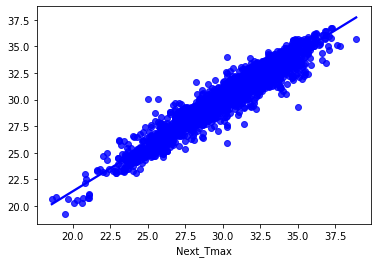

In [96]:
#checking accuracy for RandomForestRegressor
from sklearn import metrics

RFR=RandomForestRegressor()
RFR.fit(x_train, y_train)

predRFR= RFR.predict(x_test)
print('R2_score:', r2_score(y_test, predRFR))

print('MAE:',metrics.mean_absolute_error(y_test, predRFR))
print('MSE:', metrics.mean_squared_error(y_test, predRFR))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

#Visualizing the predicted values
sns.regplot(y_test, predRFR, color='blue')
plt.show()

# Decision Tree Regressor

R2_score: 0.7836804853301446
MAE: 1.0422288078760709
MSE: 2.209300410510559
RMSE: 1.4863715586994253


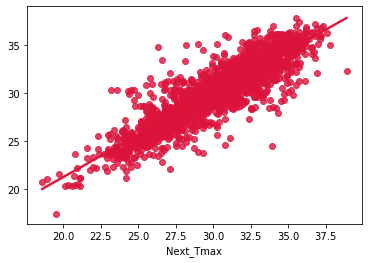

In [97]:
#checking accuracy for decision tree classifier
from sklearn.tree import DecisionTreeRegressor
DTR=DecisionTreeRegressor()
DTR.fit(x_train, y_train)

predDTR= DTR.predict(x_test)
print('R2_score:', r2_score(y_test, predDTR))

print('MAE:',metrics.mean_absolute_error(y_test, predDTR))
print('MSE:', metrics.mean_squared_error(y_test, predDTR))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predDTR)))

#Visualizing the predicted values
sns.regplot(y_test, predDTR, color='crimson')
plt.show()

# GradientBoosting Regressor

R2_score: 0.8110744216718437
MAE: 1.0815464539577055
MSE: 1.929522439958141
RMSE: 1.3890725106912674


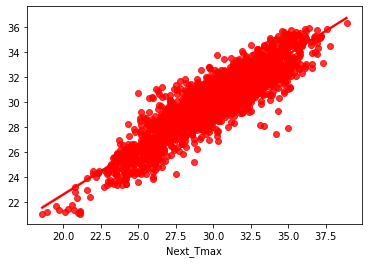

In [98]:
GB=GradientBoostingRegressor()
GB.fit(x_train, y_train)

predGB= GB.predict(x_test)
print('R2_score:', r2_score(y_test, predGB))

print('MAE:',metrics.mean_absolute_error(y_test, predGB))
print('MSE:', metrics.mean_squared_error(y_test, predGB))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predGB)))

#Visualizing the predicted values
sns.regplot(y_test, predGB, color='red')
plt.show()

# BaggingRegressor

R2_score: 0.8953544459314218
MAE: 0.760257758781413
MSE: 1.068759172812771
RMSE: 1.033808092835789


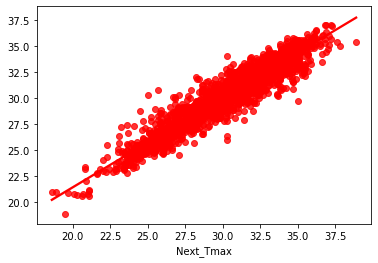

In [99]:
from sklearn.ensemble import BaggingRegressor
BR=BaggingRegressor()
BR.fit(x_train, y_train)

predBR= BR.predict(x_test)
print('R2_score:', r2_score(y_test, predBR))

print('MAE:',metrics.mean_absolute_error(y_test, predBR))
print('MSE:', metrics.mean_squared_error(y_test, predBR))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predBR)))

#Visualizing the predicted values
sns.regplot(y_test, predBR, color='red')
plt.show()

# XGB Regressor

R2_score: 0.9216448037565508
MAE: 0.673986160700417
MSE: 0.80025219865386
RMSE: 0.8945681632239435


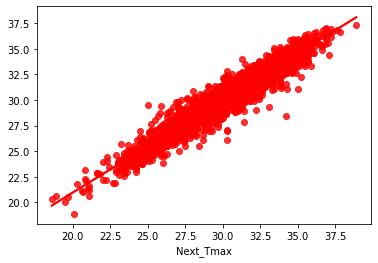

In [100]:
from xgboost import XGBRegressor as xgb

XGB=xgb(verbosity=0)
XGB.fit(x_train, y_train)

predXGB= XGB.predict(x_test)
print('R2_score:', r2_score(y_test, predXGB))

print('MAE:',metrics.mean_absolute_error(y_test, predXGB))
print('MSE:', metrics.mean_squared_error(y_test, predXGB))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predXGB)))

#Visualizing the predicted values
sns.regplot(y_test, predXGB, color='red')
plt.show()

# Checking the Cross Validation Score


In [101]:
from sklearn.model_selection import cross_val_score

In [102]:
# checking cv score for RandomForest Regressor

print(cross_val_score(RFR, x,y, cv=5).mean())

0.9073539847977754


In [103]:
# checking cv score for Decision Tree Regressor
print(cross_val_score(DTR, x,y, cv=5).mean())

0.7965747348477933


In [113]:
# checking cv score for GradientBoosting Regressor
print(cross_val_score(GB, x,y, cv=5).mean())

0.799964322765185


In [114]:
# checking cv score for Bagging Regressor
print(cross_val_score(BR, x,y, cv=5).mean())

0.8902003041780855


In [115]:
# checking cv score for XGBoot Regressor
print(cross_val_score(XGB, x,y, cv=5).mean())

0.9159120825791816


From the difference between R2 score and cross validation we can conclude that XGB Regressor is our best fitmodel. We can perfor the hypertuning on the bestmodel

# Hyper Parameter Tuning


In [116]:
from sklearn.model_selection import GridSearchCV

In [117]:
#xgb regresor
parameters={'n_extimators':[50,100],
           'gamma':np.arange(0,0.1),
           'max_depth':[4,6],
           'learning_rate':np.arange(0.05,0.5)}

In [118]:
GCV=GridSearchCV(xgb(), parameters, cv=5)

In [119]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    enable_categorical=False, gamma=None,
                                    gpu_id=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, predictor=None,
                                    random_state=None, reg_alpha=None,
                                    reg_lambda=None, scale_pos_weight=None,
       

In [120]:
GCV.best_params_

{'gamma': 0.0, 'learning_rate': 0.05, 'max_depth': 6, 'n_extimators': 50}

In [121]:
Final_model1=xgb (gamma=0.0, max_depth=6, n_extimators=50, learning_rate=0.05)
Final_model1.fit(x_train, y_train)
pred =Final_model1.predict(x_test)

print('R2_score:', r2_score(y_test, pred)*100)
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('MAE:',metrics.mean_absolute_error(y_test, pred))
print('MSE:', metrics.mean_squared_error(y_test, pred))

R2_score: 86.21522440998115
RMSE: 1.1865318129061324
MAE: 0.9129050064919132
MSE: 1.4078577430383132


# Saving the Model

In [122]:
import joblib
joblib.dump(Final_model1, "Temperature_Forecast_Next_Tmax.pkl")

['Temperature_Forecast_Next_Tmax.pkl']

# Predicting the Saved model

In [123]:
model1=joblib.load("Temperature_Forecast_Next_Tmax.pkl")

prediction_Tmax=model1.predict(x_test)
prediction_Tmax

array([29.704   , 24.44989 , 25.7833  , ..., 32.41017 , 27.05323 ,
       25.124699], dtype=float32)

In [124]:
pd.DataFrame([model1.predict(x_test)[:],y_test[:]],index=["Predicted", "Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

The predicted and actual values are alomost the same

# 2. Prediction for Next_Tmin

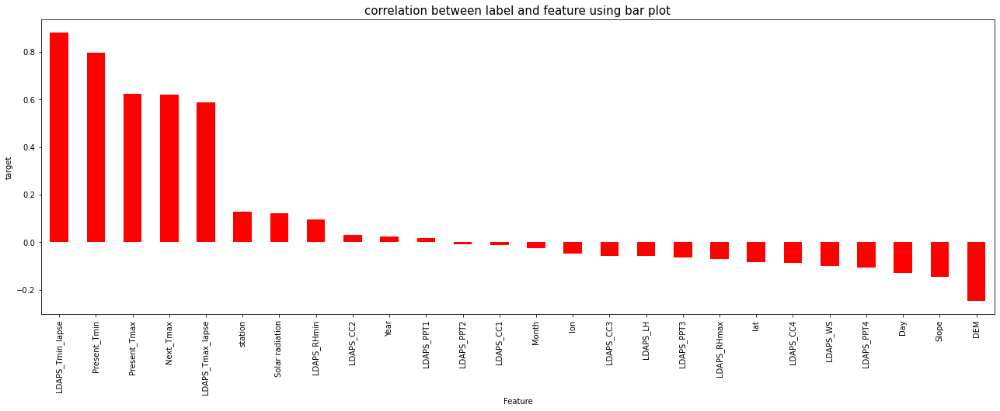

In [125]:
# Visualizing the correlation between label and features using bar plot

plt.figure(figsize=(22,7))
df.corr()['Next_Tmin'].sort_values(ascending=False).drop('Next_Tmin').plot(kind='bar', color='r')
plt.xlabel('Feature', fontsize=10)
plt.ylabel('target', fontsize=10)
plt.title('correlation between label and feature using bar plot', fontsize=15)
plt.show()

The columns Solar radiation and longitude have very less correlation with the label. We can drop the column if necessary

# Seperating the features  and label variables into x and y

In [126]:
x=df.drop("Next_Tmin", axis=1)
y=df["Next_Tmin"]

In [127]:
x.shape

(7752, 26)

In [128]:
y.shape

(7752,)

# Checking the Skewness

In [129]:
x.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.646670
LDAPS_CC4           0.673700
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340200
Day                 0.245283
Month              -0.705586
Year               -0.000365
dtype: float64

In [130]:
x.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Day', 'Month', 'Year'],
      dtype='object')

# Removing skewness using Yeo-Johson Method

In [131]:
skew=['LDAPS_RHmax','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1',
      'LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Solar radiation','Month']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [132]:
x[skew]=scaler.fit_transform(x[skew].values)
x[skew].head()

,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Month
533,1.153527,0.274966,1.505522,-0.042661,1.106605,1.393562,2.198739,2.380702,-0.492283,1.626425,0.230743,-0.591988,0.659269,-0.126054
5999,-2.186681,0.981977,0.575060,-1.738532,-0.941867,0.646643,-0.557339,-0.519114,-0.492283,-0.425926,-1.193124,-0.935044,-1.377060,0.363879
299,0.883938,-0.316505,0.883424,-0.432716,1.954949,1.752736,0.091029,2.376014,2.562260,2.681417,-1.193124,-0.935044,1.045619,2.018807
6511,-1.452975,0.019614,-0.237289,-1.310132,-1.597167,-1.428796,-0.557339,-0.519114,-0.492283,-0.444377,1.364199,-0.243155,1.231465,2.628001
6370,-0.715416,0.367047,-0.067423,-0.983725,1.683573,1.085365,-0.557339,-0.519114,2.059972,-0.444377,-0.721547,-0.279532,1.226344,-0.582534


In [133]:
#cheking skewness after using yeo-johnson
x.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.116481
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.018120
LDAPS_WS            0.002449
LDAPS_LH            0.058865
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.089672
LDAPS_CC4           0.129826
LDAPS_PPT1          1.463941
LDAPS_PPT2          1.646417
LDAPS_PPT3          1.824919
LDAPS_PPT4          2.059400
lat                 0.087062
lon                -0.285213
DEM                 0.039456
Slope               0.233968
Solar radiation    -0.176636
Next_Tmax          -0.340200
Day                 0.245283
Month               0.043780
Year               -0.000365
dtype: float64

In some columns skewness is not removed because these columns may have some extreme test level. So keeping the skewness in those columns as it is and moving further

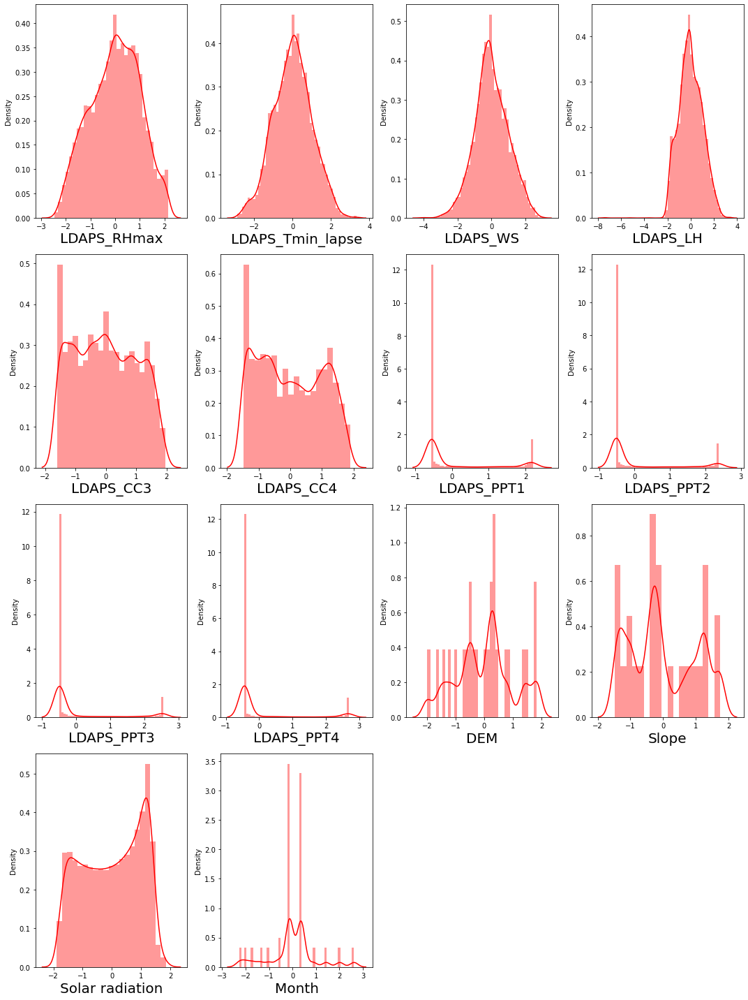

In [134]:
#after removing the skewness lets check how the data has been distributed  in each column


plt.figure(figsize=(15,20), facecolor= 'white')
plotnumber=1

for column in x[skew]:
    if plotnumber <=14:
        ax= plt.subplot(4,4, plotnumber)
        sns.distplot(x[column], color='red')
        plt.xlabel(column, fontsize=20)
        
        
    plotnumber +=1
plt.tight_layout()

since the precipitation  columns have  skewness and not in normal so we will use MinMaxScaler to scale the date

In [135]:
from sklearn.preprocessing import MinMaxScaler

mms=MinMaxScaler()
x=pd.DataFrame(mms.fit_transform(x), columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Day,Month,Year
0,0.333333,0.522727,0.747312,0.787347,0.784136,0.487136,0.510055,0.787998,0.679516,0.849143,0.918787,0.760418,0.852802,0.999978,0.999997,0.000000,0.658820,0.214513,0.000000,0.580057,0.274979,0.681477,0.590698,0.583333,0.437757,0.00
1,1.000000,0.897727,0.854839,0.184823,0.057896,0.818494,0.624076,0.658037,0.523963,0.072345,0.005792,0.184299,0.631273,0.000000,0.000000,0.000000,0.005870,0.357521,0.466019,0.207329,0.168421,0.136494,0.739535,0.625000,0.537778,0.75
2,1.000000,0.329545,0.715054,0.817783,0.725521,0.375577,0.414667,0.701108,0.643738,0.849770,0.897055,0.999009,0.959329,0.235245,0.998380,0.999996,0.994464,0.357521,0.466019,0.207329,0.168421,0.784876,0.353488,0.000000,0.875633,0.00
3,0.458333,0.636364,0.661290,0.301908,0.217421,0.649942,0.468873,0.544574,0.563258,0.000000,0.000000,0.000000,0.015718,0.000000,0.000000,0.000000,0.000000,0.500530,0.524272,0.876763,0.383332,0.834614,0.679070,0.000000,1.000000,1.00
4,0.833333,0.750000,0.736559,0.696509,0.377784,0.519243,0.524905,0.568300,0.593197,0.264237,0.586084,0.922687,0.761394,0.000000,0.000000,0.835557,0.000000,0.500530,0.692557,0.330774,0.372033,0.833243,0.516279,0.000000,0.344567,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,0.375000,0.619318,0.682796,0.445746,0.566555,0.650124,0.636999,0.657919,0.685237,0.375126,0.335406,0.145800,0.086854,0.000000,0.000000,0.000000,0.000000,0.000000,0.417476,0.995545,0.999999,0.240798,0.655814,0.333333,0.537778,0.00
7748,0.166667,0.555012,0.641132,0.779229,0.741062,0.265792,0.280034,0.686525,0.667784,0.723895,0.845429,0.951074,0.974173,0.000000,0.999239,0.999992,1.000000,0.500530,1.000000,0.443625,0.334076,0.278108,0.325581,0.291667,0.537778,1.00
7749,0.916667,0.721591,0.645161,0.434162,0.354041,0.622075,0.598708,0.505552,0.769553,0.162144,0.079821,0.249744,0.241848,0.000000,0.000000,0.000000,0.000000,0.429025,0.210356,0.106545,0.061134,0.275878,0.683721,0.291667,0.537778,0.50
7750,0.625000,0.687500,0.682796,0.351793,0.651804,0.745440,0.518258,0.496293,0.760476,0.420552,0.246573,0.480317,0.429701,0.205056,0.000000,0.000000,0.000000,0.071504,0.546926,0.738127,0.810963,0.502956,0.734884,1.000000,0.437757,0.25


# Checking VIF Values(Variance Inflation Factor)

In [136]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.598736,station
1,35.154944,Present_Tmax
2,78.080026,Present_Tmin
3,45.986393,LDAPS_RHmin
4,18.751390,LDAPS_RHmax
5,120.720770,LDAPS_Tmax_lapse
6,53.866135,LDAPS_Tmin_lapse
7,20.862029,LDAPS_WS
8,65.951880,LDAPS_LH
9,15.227578,LDAPS_CC1


The column Next_Tmin has VIF greater than 10, we will remove this to overcome with the issue of multicolinearity. After dropping
the column will check VIF again. If we find the value above 10 then we will remove that column having VIF. This process will continue
until will get the VIF less than 10

In [137]:
x.drop("LDAPS_Tmax_lapse", axis=1, inplace=True)

In [138]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.586394,station
1,34.024946,Present_Tmax
2,76.651388,Present_Tmin
3,33.305067,LDAPS_RHmin
4,18.645062,LDAPS_RHmax
5,35.936728,LDAPS_Tmin_lapse
6,20.603655,LDAPS_WS
7,60.166409,LDAPS_LH
8,15.194305,LDAPS_CC1
9,17.548304,LDAPS_CC2


In [139]:
x.drop("Present_Tmin", axis=1, inplace=True)

In [140]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.577625,station
1,30.287860,Present_Tmax
2,33.197151,LDAPS_RHmin
3,18.271453,LDAPS_RHmax
4,29.265116,LDAPS_Tmin_lapse
5,19.912522,LDAPS_WS
6,59.373761,LDAPS_LH
7,14.917525,LDAPS_CC1
8,17.546022,LDAPS_CC2
9,17.732365,LDAPS_CC3


In [141]:
x.drop("LDAPS_LH", axis=1, inplace=True)

In [142]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.574447,station
1,26.816344,Present_Tmax
2,32.422043,LDAPS_RHmin
3,16.202650,LDAPS_RHmax
4,25.399373,LDAPS_Tmin_lapse
5,18.049204,LDAPS_WS
6,14.507811,LDAPS_CC1
7,17.170673,LDAPS_CC2
8,17.679300,LDAPS_CC3
9,9.675928,LDAPS_CC4


In [143]:
x.drop("LDAPS_RHmin", axis=1, inplace=True)

In [144]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.574416,station
1,26.650741,Present_Tmax
2,11.159375,LDAPS_RHmax
3,22.933396,LDAPS_Tmin_lapse
4,17.551276,LDAPS_WS
5,14.428752,LDAPS_CC1
6,16.306816,LDAPS_CC2
7,15.975553,LDAPS_CC3
8,9.664868,LDAPS_CC4
9,3.333713,LDAPS_PPT1


In [145]:
x.drop("Next_Tmax", axis=1, inplace=True)

In [146]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.353489,station
1,21.959437,Present_Tmax
2,10.499715,LDAPS_RHmax
3,17.943622,LDAPS_Tmin_lapse
4,17.494162,LDAPS_WS
5,14.424490,LDAPS_CC1
6,15.972219,LDAPS_CC2
7,15.747872,LDAPS_CC3
8,9.644795,LDAPS_CC4
9,3.300489,LDAPS_PPT1


In [147]:
x.drop("Present_Tmax", axis=1, inplace=True)

In [148]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,4.249027,station
1,10.494177,LDAPS_RHmax
2,8.455903,LDAPS_Tmin_lapse
3,16.864879,LDAPS_WS
4,13.559921,LDAPS_CC1
5,15.963881,LDAPS_CC2
6,15.656609,LDAPS_CC3
7,9.638630,LDAPS_CC4
8,3.270818,LDAPS_PPT1
9,2.956593,LDAPS_PPT2


In [149]:
x.drop("LDAPS_WS", axis=1, inplace=True)

In [150]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.968764,station
1,10.436610,LDAPS_RHmax
2,7.862778,LDAPS_Tmin_lapse
3,13.491842,LDAPS_CC1
4,15.963879,LDAPS_CC2
5,15.636448,LDAPS_CC3
6,9.616443,LDAPS_CC4
7,3.269027,LDAPS_PPT1
8,2.955624,LDAPS_PPT2
9,2.200587,LDAPS_PPT3


In [151]:
x.drop("LDAPS_CC2", axis=1,inplace=True)

In [152]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.968088,station
1,10.275045,LDAPS_RHmax
2,7.779405,LDAPS_Tmin_lapse
3,9.312590,LDAPS_CC1
4,12.846864,LDAPS_CC3
5,9.616340,LDAPS_CC4
6,3.072742,LDAPS_PPT1
7,2.322113,LDAPS_PPT2
8,2.199760,LDAPS_PPT3
9,2.027317,LDAPS_PPT4


In [153]:
x.drop("DEM", axis=1, inplace=True)

In [154]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.680109,station
1,10.128386,LDAPS_RHmax
2,7.716922,LDAPS_Tmin_lapse
3,9.311825,LDAPS_CC1
4,12.843669,LDAPS_CC3
5,9.614301,LDAPS_CC4
6,3.068458,LDAPS_PPT1
7,2.318813,LDAPS_PPT2
8,2.199743,LDAPS_PPT3
9,2.027274,LDAPS_PPT4


In [155]:
x.drop("LDAPS_CC3", axis=1, inplace=True)

In [156]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.680031,station
1,10.128315,LDAPS_RHmax
2,7.687641,LDAPS_Tmin_lapse
3,8.363750,LDAPS_CC1
4,5.068478,LDAPS_CC4
5,2.973010,LDAPS_PPT1
6,2.303686,LDAPS_PPT2
7,1.977942,LDAPS_PPT3
8,2.015596,LDAPS_PPT4
9,4.878332,lat


In [157]:
x.drop("LDAPS_RHmax", axis=1)

,station,LDAPS_Tmin_lapse,LDAPS_CC1,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,Slope,Solar radiation,Day,Month,Year
0,0.333333,0.510055,0.849143,0.852802,0.999978,0.999997,0.000000,0.658820,0.214513,0.000000,0.274979,0.681477,0.583333,0.437757,0.00
1,1.000000,0.624076,0.072345,0.631273,0.000000,0.000000,0.000000,0.005870,0.357521,0.466019,0.168421,0.136494,0.625000,0.537778,0.75
2,1.000000,0.414667,0.849770,0.959329,0.235245,0.998380,0.999996,0.994464,0.357521,0.466019,0.168421,0.784876,0.000000,0.875633,0.00
3,0.458333,0.468873,0.000000,0.015718,0.000000,0.000000,0.000000,0.000000,0.500530,0.524272,0.383332,0.834614,0.000000,1.000000,1.00
4,0.833333,0.524905,0.264237,0.761394,0.000000,0.000000,0.835557,0.000000,0.500530,0.692557,0.372033,0.833243,0.000000,0.344567,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,0.375000,0.636999,0.375126,0.086854,0.000000,0.000000,0.000000,0.000000,0.000000,0.417476,0.999999,0.240798,0.333333,0.537778,0.00
7748,0.166667,0.280034,0.723895,0.974173,0.000000,0.999239,0.999992,1.000000,0.500530,1.000000,0.334076,0.278108,0.291667,0.537778,1.00
7749,0.916667,0.598708,0.162144,0.241848,0.000000,0.000000,0.000000,0.000000,0.429025,0.210356,0.061134,0.275878,0.291667,0.537778,0.50
7750,0.625000,0.518258,0.420552,0.429701,0.205056,0.000000,0.000000,0.000000,0.071504,0.546926,0.810963,0.502956,1.000000,0.437757,0.25


In [158]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif values"]=[variance_inflation_factor(x.values, i) 
              for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,vif values,Features
0,3.680031,station
1,10.128315,LDAPS_RHmax
2,7.687641,LDAPS_Tmin_lapse
3,8.363750,LDAPS_CC1
4,5.068478,LDAPS_CC4
5,2.973010,LDAPS_PPT1
6,2.303686,LDAPS_PPT2
7,1.977942,LDAPS_PPT3
8,2.015596,LDAPS_PPT4
9,4.878332,lat


In [159]:
x.head()

,station,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_CC1,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,Slope,Solar radiation,Day,Month,Year
0,0.333333,0.784136,0.510055,0.849143,0.852802,0.999978,0.999997,0.000000,0.658820,0.214513,0.000000,0.274979,0.681477,0.583333,0.437757,0.00
1,1.000000,0.057896,0.624076,0.072345,0.631273,0.000000,0.000000,0.000000,0.005870,0.357521,0.466019,0.168421,0.136494,0.625000,0.537778,0.75
2,1.000000,0.725521,0.414667,0.849770,0.959329,0.235245,0.998380,0.999996,0.994464,0.357521,0.466019,0.168421,0.784876,0.000000,0.875633,0.00
3,0.458333,0.217421,0.468873,0.000000,0.015718,0.000000,0.000000,0.000000,0.000000,0.500530,0.524272,0.383332,0.834614,0.000000,1.000000,1.00
4,0.833333,0.377784,0.524905,0.264237,0.761394,0.000000,0.000000,0.835557,0.000000,0.500530,0.692557,0.372033,0.833243,0.000000,0.344567,1.00


In [160]:
x.shape

(7752, 16)

# Finding best Random State and Accuracy:


In [161]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report,r2_score,roc_curve, confusion_matrix
from sklearn.preprocessing import LabelEncoder,StandardScaler,MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.model_selection import train_test_split, cross_validate,GridSearchCV, KFold, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC


In [162]:
maxAccu=0
maxRS=0

for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y, test_size=0.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test, pred)
    
    if acc>maxAccu:
        maxAccu=acc
        maxRs=i
print("Maximum r2 score is", maxAccu, "on Random_state", maxRs)

Maximum r2 score is 0.8998289132789072 on Random_state 155


# Creating Train test Split

In [163]:
x_train,x_test,y_train,y_test=train_test_split(x,y, test_size=0.30, random_state=155)

# Random Forest Regressor

R2_score: 0.8994276176947225
MAE: 0.5926252941422001
MSE: 0.6150200065892162
RMSE: 0.7842321126995605


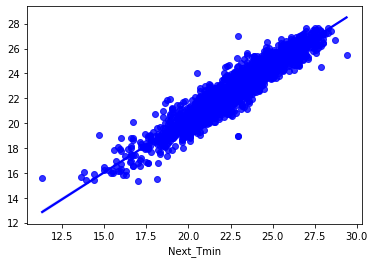

In [164]:
#checking accuracy for RandomForestRegressor
from sklearn import metrics

RFR=RandomForestRegressor()
RFR.fit(x_train, y_train)

predRFR= RFR.predict(x_test)
print('R2_score:', r2_score(y_test, predRFR))

print('MAE:',metrics.mean_absolute_error(y_test, predRFR))
print('MSE:', metrics.mean_squared_error(y_test, predRFR))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

#Visualizing the predicted values
sns.regplot(y_test, predRFR, color='blue')
plt.show()

# Decision Tree Regressor

R2_score: 0.7648632522364309
MAE: 0.8916055286100284
MSE: 1.4379077122778716
RMSE: 1.1991278965472665


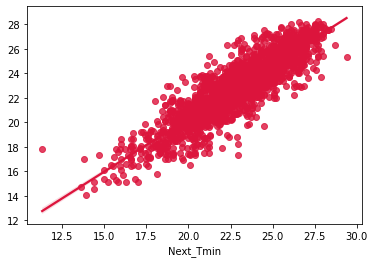

In [165]:
#checking accuracy for decision tree classifier
from sklearn.tree import DecisionTreeRegressor
DTR=DecisionTreeRegressor()
DTR.fit(x_train, y_train)

predDTR= DTR.predict(x_test)
print('R2_score:', r2_score(y_test, predDTR))

print('MAE:',metrics.mean_absolute_error(y_test, predDTR))
print('MSE:', metrics.mean_squared_error(y_test, predDTR))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predDTR)))

#Visualizing the predicted values
sns.regplot(y_test, predDTR, color='crimson')
plt.show()

# GradientBoosting Regressor

R2_score: 0.8866044789252072
MAE: 0.6328523642073052
MSE: 0.6934360360174845
RMSE: 0.8327280684698244


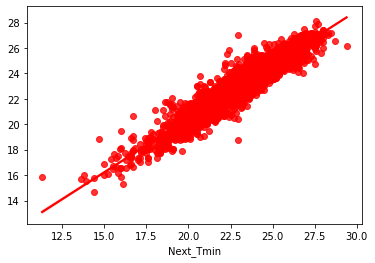

In [166]:
GB=GradientBoostingRegressor()
GB.fit(x_train, y_train)

predGB= GB.predict(x_test)
print('R2_score:', r2_score(y_test, predGB))

print('MAE:',metrics.mean_absolute_error(y_test, predGB))
print('MSE:', metrics.mean_squared_error(y_test, predGB))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predGB)))

#Visualizing the predicted values
sns.regplot(y_test, predGB, color='red')
plt.show()

# BaggingRegressor

R2_score: 0.8838785044374451
MAE: 0.6386759819349022
MSE: 0.7101059090879718
RMSE: 0.8426778204557017


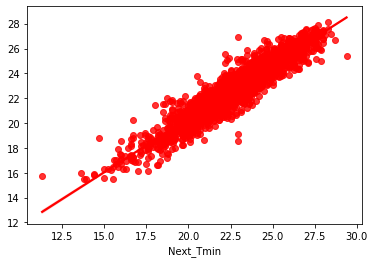

In [167]:
from sklearn.ensemble import BaggingRegressor
BR=BaggingRegressor()
BR.fit(x_train, y_train)

predBR= BR.predict(x_test)
print('R2_score:', r2_score(y_test, predBR))

print('MAE:',metrics.mean_absolute_error(y_test, predBR))
print('MSE:', metrics.mean_squared_error(y_test, predBR))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predBR)))

#Visualizing the predicted values
sns.regplot(y_test, predBR, color='red')
plt.show()

# XGB Regressor

R2_score: 0.9320858334966197
MAE: 0.4813740877832875
MSE: 0.4153085586023582
RMSE: 0.6444443797585314


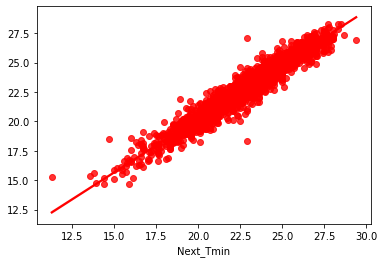

In [168]:
from xgboost import XGBRegressor as xgb

XGB=xgb(verbosity=0)
XGB.fit(x_train, y_train)

predXGB= XGB.predict(x_test)
print('R2_score:', r2_score(y_test, predXGB))

print('MAE:',metrics.mean_absolute_error(y_test, predXGB))
print('MSE:', metrics.mean_squared_error(y_test, predXGB))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, predXGB)))

#Visualizing the predicted values
sns.regplot(y_test, predXGB, color='red')
plt.show()

# Checking the Cross Validation Score


In [169]:
from sklearn.model_selection import cross_val_score

In [170]:
# checking cv score for RandomForest Regressor

print(cross_val_score(RFR, x,y, cv=5).mean())

0.8913758927001298


In [171]:
# checking cv score for Decision Tree Regressor
print(cross_val_score(DTR, x,y, cv=5).mean())

0.7591807874891021


In [172]:
# checking cv score for GradientBoosting Regressor
print(cross_val_score(GB, x,y, cv=5).mean())

0.8745852494706586


In [173]:
# checking cv score for Bagging Regressor
print(cross_val_score(BR, x,y, cv=5).mean())

0.8746542533336743


In [174]:
# checking cv score for XGBoot Regressor
print(cross_val_score(XGB, x,y, cv=5).mean())

0.931886180565137


From the difference between R2 score and cross validation we can conclude that XGB Regressor is our best fitmodel. We can perfor the hypertuning on the bestmodel

# Hyper Parameter Tuning


In [175]:
from sklearn.model_selection import GridSearchCV

In [176]:
#xgb regresor
parameters={'n_extimators':[50,100],
           'gamma':np.arange(0,0.1),
           'max_depth':[4,6],
           'learning_rate':np.arange(0.05,0.5)}

In [177]:
GCV=GridSearchCV(xgb(), parameters, cv=5)

In [178]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    enable_categorical=False, gamma=None,
                                    gpu_id=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, predictor=None,
                                    random_state=None, reg_alpha=None,
                                    reg_lambda=None, scale_pos_weight=None,
       

In [179]:
GCV.best_params_

{'gamma': 0.0, 'learning_rate': 0.05, 'max_depth': 6, 'n_extimators': 50}

In [180]:
Final_model2=xgb (gamma=0.0, max_depth=6, n_extimators=50, learning_rate=0.05)
Final_model2.fit(x_train, y_train)
pred =Final_model2.predict(x_test)

print('R2_score:', r2_score(y_test, pred)*100)
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('MAE:',metrics.mean_absolute_error(y_test, pred))
print('MSE:', metrics.mean_squared_error(y_test, pred))

R2_score: 90.24291418475046
RMSE: 0.7724409963392224
MAE: 0.5910814040859665
MSE: 0.5966650928255305


# Saving the Model

In [181]:
import joblib
joblib.dump(Final_model2, "Temperature_Forecast_Next_Tmin.pkl")

['Temperature_Forecast_Next_Tmin.pkl']

# Predicting the Saved model

In [183]:
model2=joblib.load("Temperature_Forecast_Next_Tmin.pkl")

prediction_Tmin=model2.predict(x_test)
prediction_Tmin

array([23.33815 , 24.124527, 23.14706 , ..., 19.820715, 22.925694,
       17.630522], dtype=float32)

In [185]:
pd.DataFrame([model2.predict(x_test)[:],y_test[:]],index=["Predicted", "Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

The predicted and actual values are alomost the same

# Thank You